#Mount Drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Defining the project path
Must do it only once. Even if run accidentally again, it won't matter.

In [ ]:
from pathlib import Path

PROJECT_ROOT = Path("/content/drive/MyDrive/LicensePlateProject")

NOTEBOOK_DIR = PROJECT_ROOT / "Notebook"
DATA_DIR = PROJECT_ROOT / "data"
RAW_DIR = DATA_DIR / "raw" / "kaggle_download"
WORKING_DIR = DATA_DIR / "working"
YOLO_DIR = DATA_DIR / "yolo_dataset"

IMAGES_TRAIN_DIR = YOLO_DIR / "images" / "train"
IMAGES_VAL_DIR = YOLO_DIR / "images" / "val"
IMAGES_TEST_DIR = YOLO_DIR / "images" / "test"

LABELS_TRAIN_DIR = YOLO_DIR / "labels" / "train"
LABELS_VAL_DIR = YOLO_DIR / "labels" / "val"
LABELS_TEST_DIR = YOLO_DIR / "labels" / "test"

REPORT_DIR = PROJECT_ROOT / "report"
REPORT_FIGURES_DIR = REPORT_DIR / "figures"

OUTPUTS_DIR = PROJECT_ROOT / "outputs"
OUTPUTS_TRAIN_DIR = OUTPUTS_DIR / "train"
OUTPUTS_VAL_DIR = OUTPUTS_DIR / "val"
OUTPUTS_PREDICT_DIR = OUTPUTS_DIR / "predict"
OUTPUTS_MODELS_DIR = OUTPUTS_DIR / "models"

YAML_PATH = YOLO_DIR / "license_plate.yaml"

In [ ]:
folders = [
    NOTEBOOK_DIR,
    RAW_DIR,
    WORKING_DIR,
    IMAGES_TRAIN_DIR, IMAGES_VAL_DIR, IMAGES_TEST_DIR,
    LABELS_TRAIN_DIR, LABELS_VAL_DIR, LABELS_TEST_DIR,
    REPORT_DIR, REPORT_FIGURES_DIR,
    OUTPUTS_DIR, OUTPUTS_TRAIN_DIR, OUTPUTS_VAL_DIR,
    OUTPUTS_PREDICT_DIR, OUTPUTS_MODELS_DIR
]

for folder in folders:
    folder.mkdir(parents=True, exist_ok=True)

print("Project folders are ready.")
print(f"Project root: {PROJECT_ROOT}")

Project folders are ready.
Project root: /content/drive/MyDrive/LicensePlateProject


#Quick folder check

In [ ]:
for path in [
    PROJECT_ROOT, NOTEBOOK_DIR, DATA_DIR, RAW_DIR, WORKING_DIR,
    YOLO_DIR, REPORT_DIR, OUTPUTS_DIR
]:
    print(path)

/content/drive/MyDrive/LicensePlateProject
/content/drive/MyDrive/LicensePlateProject/Notebook
/content/drive/MyDrive/LicensePlateProject/data
/content/drive/MyDrive/LicensePlateProject/data/raw/kaggle_download
/content/drive/MyDrive/LicensePlateProject/data/working
/content/drive/MyDrive/LicensePlateProject/data/yolo_dataset
/content/drive/MyDrive/LicensePlateProject/report
/content/drive/MyDrive/LicensePlateProject/outputs


#Installing Core Libraries

In [3]:
!pip -q install ultralytics kagglehub lxml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 33.3 MB/s eta 0:00:00


#Runtime Check

In [ ]:
import os
import sys
import torch

print("Python version:", sys.version)
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("GPU not enabled. In Colab: Runtime > Change runtime type > T4 GPU")

Python version: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
PyTorch version: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4


#Downloading the dataset and copy it into raw folder

In [ ]:
import shutil
from pathlib import Path
import kagglehub

RAW_DIR = Path("/content/drive/MyDrive/LicensePlateProject/data/raw/kaggle_download")
RAW_DIR.mkdir(parents=True, exist_ok=True)

dataset_slug = "andrewmvd/car-plate-detection"
dataset_folder_name = "car-plate-detection"

raw_dataset_dir = RAW_DIR / dataset_folder_name

if raw_dataset_dir.exists() and any(raw_dataset_dir.iterdir()):
    print("Dataset already exists in Drive. Skipping download.")
    print("Using dataset at:", raw_dataset_dir)
else:
    downloaded_path = Path(kagglehub.dataset_download(dataset_slug))
    print("Downloaded dataset to cache:", downloaded_path)

    if raw_dataset_dir.exists():
        shutil.rmtree(raw_dataset_dir)

    shutil.copytree(downloaded_path, raw_dataset_dir)
    print("Copied dataset to Drive:", raw_dataset_dir)

Dataset already exists in Drive. Skipping download.
Using dataset at: /content/drive/MyDrive/LicensePlateProject/data/raw/kaggle_download/car-plate-detection


#Inspect the dataset

In [ ]:
from pathlib import Path

images_dir = raw_dataset_dir / "images"
annotations_dir = raw_dataset_dir / "annotations"

print("Top-level contents:")
for item in raw_dataset_dir.iterdir():
    print("-", item.name)

print("\nImages directory exists:", images_dir.exists())
print("Annotations directory exists:", annotations_dir.exists())

Top-level contents:
- annotations
- images

Images directory exists: True
Annotations directory exists: True


#Inspecting the data
We have 3 main questions:

1_ What image files are inside images/

2_ what annotation files are inside annotations/

3_ are the annotations in XML format or are the YOLO ready?


In [ ]:
from pathlib import Path

raw_dataset_dir = RAW_DIR / dataset_folder_name

images_dir = raw_dataset_dir / "images"
annotations_dir = raw_dataset_dir / "annotations"

print("Images directory exists:", images_dir.exists())
print("Annotations directory exists:", annotations_dir.exists())

print("\nFirst 10 image files:")
image_files = sorted([p.name for p in images_dir.iterdir() if p.is_file()])
for name in image_files[:10]:
    print("-", name)

print("\nFirst 10 annotation files:")
annotation_files = sorted([p.name for p in annotations_dir.iterdir() if p.is_file()])
for name in annotation_files[:10]:
    print("-", name)

print("\nTotal images:", len(image_files))
print("Total annotation files:", len(annotation_files))

Images directory exists: True
Annotations directory exists: True

First 10 image files:
- Cars0.png
- Cars1.png
- Cars10.png
- Cars100.png
- Cars101.png
- Cars102.png
- Cars103.png
- Cars104.png
- Cars105.png
- Cars106.png

First 10 annotation files:
- Cars0.xml
- Cars1.xml
- Cars10.xml
- Cars100.xml
- Cars101.xml
- Cars102.xml
- Cars103.xml
- Cars104.xml
- Cars105.xml
- Cars106.xml

Total images: 433
Total annotation files: 433


In [ ]:
sample_ann = sorted([p for p in annotations_dir.iterdir() if p.is_file()])[0]

print("Sample annotation file name:", sample_ann.name)
print("\nFirst 40 lines of the annotation file:\n")

with open(sample_ann, "r", encoding="utf-8", errors="ignore") as f:
    for i, line in enumerate(f):
        if i >= 40:
            break
        print(line.rstrip())

Sample annotation file name: Cars0.xml

First 40 lines of the annotation file:


<annotation>
    <folder>images</folder>
    <filename>Cars0.png</filename>
    <size>
        <width>500</width>
        <height>268</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>licence</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>226</xmin>
            <ymin>125</ymin>
            <xmax>419</xmax>
            <ymax>173</ymax>
        </bndbox>
    </object>
</annotation>


#Preparing the dataset
We will now work on:

1_inspect whether all XML files use the same class name

2_ convert VOC XML to YOLO txt

3_ split dataset into train/val/test

4_ create license_plate.yaml

In [ ]:
import xml.etree.ElementTree as ET
from collections import Counter

class_counter = Counter()

xml_files = sorted(annotations_dir.glob("*.xml"))

for xml_file in xml_files:
    tree = ET.parse(xml_file)
    root = tree.getroot()

    for obj in root.findall("object"):
        name = obj.find("name")
        if name is not None and name.text is not None:
            class_counter[name.text.strip()] += 1

print("Classes found:")
for cls, count in class_counter.items():
    print(f"- {cls}: {count}")

Classes found:
- licence: 471


In [ ]:
import shutil
from pathlib import Path

converted_labels_dir = WORKING_DIR / "converted_labels"

if converted_labels_dir.exists():
    shutil.rmtree(converted_labels_dir)

converted_labels_dir.mkdir(parents=True, exist_ok=True)
print("Clean converted_labels folder ready.")

Clean converted_labels folder ready.


In [ ]:
import xml.etree.ElementTree as ET

CLASS_MAP = {
    "licence": 0
}

def convert_box(size, box):
    img_w, img_h = size
    xmin, ymin, xmax, ymax = box

    x_center = ((xmin + xmax) / 2) / img_w
    y_center = ((ymin + ymax) / 2) / img_h
    width = (xmax - xmin) / img_w
    height = (ymax - ymin) / img_h

    return x_center, y_center, width, height

converted_count = 0
total_objects = 0

for xml_file in sorted(annotations_dir.glob("*.xml")):
    tree = ET.parse(xml_file)
    root = tree.getroot()

    size = root.find("size")
    img_w = int(size.find("width").text)
    img_h = int(size.find("height").text)

    yolo_lines = []

    for obj in root.findall("object"):
        class_name = obj.find("name").text.strip()

        if class_name not in CLASS_MAP:
            continue

        class_id = CLASS_MAP[class_name]

        bndbox = obj.find("bndbox")
        xmin = float(bndbox.find("xmin").text)
        ymin = float(bndbox.find("ymin").text)
        xmax = float(bndbox.find("xmax").text)
        ymax = float(bndbox.find("ymax").text)

        x_center, y_center, width, height = convert_box(
            (img_w, img_h), (xmin, ymin, xmax, ymax)
        )

        yolo_lines.append(
            f"{class_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
        )
        total_objects += 1

    output_file = converted_labels_dir / f"{xml_file.stem}.txt"
    with open(output_file, "w") as f:
        f.write("\n".join(yolo_lines))

    converted_count += 1

print("Converted XML files:", converted_count)
print("Total converted objects:", total_objects)
print("Converted label folder:", converted_labels_dir)

Converted XML files: 433
Total converted objects: 471
Converted label folder: /content/drive/MyDrive/LicensePlateProject/data/working/converted_labels


In [ ]:
sample_txt = sorted(converted_labels_dir.glob("*.txt"))[0]
print("Sample converted label:", sample_txt.name)

with open(sample_txt, "r") as f:
    print(f.read())

Sample converted label: Cars0.txt
0 0.645000 0.555970 0.386000 0.179104


In [ ]:
non_empty = 0
empty = 0

for txt_file in converted_labels_dir.glob("*.txt"):
    content = txt_file.read_text().strip()
    if content:
        non_empty += 1
    else:
        empty += 1

print("Non-empty label files:", non_empty)
print("Empty label files:", empty)

Non-empty label files: 433
Empty label files: 0


#Split the data
Now the next step is to split the data and put them in their appropriate folders.
We will always clear the folders first in case we decide to rerun the whole code.
We will also create the YAML file.

In [ ]:
import shutil

# Remove old images/labels folders if they already contain previous runs
for folder in [IMAGES_TRAIN_DIR, IMAGES_VAL_DIR, IMAGES_TEST_DIR,
               LABELS_TRAIN_DIR, LABELS_VAL_DIR, LABELS_TEST_DIR]:
    if folder.exists():
        shutil.rmtree(folder)
    folder.mkdir(parents=True, exist_ok=True)

print("Clean YOLO train/val/test folders are ready.")

Clean YOLO train/val/test folders are ready.


match images with converted labels and split

In [ ]:
import random

random.seed(42)

all_images = sorted(images_dir.glob("*.png"))

pairs = []
for img_file in all_images:
    label_file = converted_labels_dir / f"{img_file.stem}.txt"
    if label_file.exists():
        pairs.append((img_file, label_file))

print("Matched image-label pairs:", len(pairs))

random.shuffle(pairs)

n = len(pairs)
train_end = int(0.7 * n)
val_end = int(0.85 * n)

train_pairs = pairs[:train_end]
val_pairs = pairs[train_end:val_end]
test_pairs = pairs[val_end:]

print("Train:", len(train_pairs))
print("Val:", len(val_pairs))
print("Test:", len(test_pairs))

Matched image-label pairs: 433
Train: 303
Val: 65
Test: 65


copy files into final YOLO folders

In [ ]:
import shutil

def copy_pairs(pairs_list, img_dest, label_dest):
    for img_file, label_file in pairs_list:
        shutil.copy2(img_file, img_dest / img_file.name)
        shutil.copy2(label_file, label_dest / label_file.name)

copy_pairs(train_pairs, IMAGES_TRAIN_DIR, LABELS_TRAIN_DIR)
copy_pairs(val_pairs, IMAGES_VAL_DIR, LABELS_VAL_DIR)
copy_pairs(test_pairs, IMAGES_TEST_DIR, LABELS_TEST_DIR)

print("Copied dataset into YOLO train/val/test folders.")

Copied dataset into YOLO train/val/test folders.


verify counts

In [ ]:
print("Train images:", len(list(IMAGES_TRAIN_DIR.glob("*.png"))))
print("Train labels:", len(list(LABELS_TRAIN_DIR.glob("*.txt"))))

print("Val images:", len(list(IMAGES_VAL_DIR.glob("*.png"))))
print("Val labels:", len(list(LABELS_VAL_DIR.glob("*.txt"))))

print("Test images:", len(list(IMAGES_TEST_DIR.glob("*.png"))))
print("Test labels:", len(list(LABELS_TEST_DIR.glob("*.txt"))))

Train images: 303
Train labels: 303
Val images: 65
Val labels: 65
Test images: 65
Test labels: 65


create license_plate.yaml

In [ ]:
yaml_text = f"""
path: {YOLO_DIR}
train: images/train
val: images/val
test: images/test

names:
  0: licence
""".strip()

with open(YAML_PATH, "w") as f:
    f.write(yaml_text)

print("YAML file created at:", YAML_PATH)
print("\n--- YAML content ---\n")
print(yaml_text)

YAML file created at: /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/license_plate.yaml

--- YAML content ---

path: /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset
train: images/train
val: images/val
test: images/test

names:
  0: licence


#Training the YOLO model
Now we have prepared the structure for the data.
We now have to import the trained model and train it on the current data.

In [ ]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


We use a small pretrained model first

In [ ]:
model = YOLO("yolov8n.pt")

results = model.train(
    data=str(YAML_PATH),
    epochs=25, # goes over all pictures 25 times
    imgsz=640,
    project=str(OUTPUTS_TRAIN_DIR),
    name="yolo_baseline",
    exist_ok=True
)

Ultralytics 8.4.37 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/license_plate.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=25, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo_baseline, nbs=64, nms=False, opset=None, optimiz

In [ ]:
from pathlib import Path

yolo_baseline_run_dir = OUTPUTS_TRAIN_DIR / "yolo_baseline"
yolo_baseline_weights_dir = yolo_baseline_run_dir / "weights"
yolo_baseline_best_path = yolo_baseline_weights_dir / "best.pt"

print("Run dir:", yolo_baseline_run_dir)
print("Exists:", yolo_baseline_run_dir.exists())
print("Weights dir exists:", yolo_baseline_weights_dir.exists())
print("Best exists:", yolo_baseline_best_path.exists())

if yolo_baseline_weights_dir.exists():
    print("\nWeights folder contents:")
    for p in sorted(yolo_baseline_weights_dir.iterdir()):
        print("-", p.name)

Run dir: /content/drive/MyDrive/LicensePlateProject/outputs/train/yolo_baseline
Exists: True
Weights dir exists: True
Best exists: True

Weights folder contents:
- best.pt
- last.pt


Validation after training

In [ ]:
from ultralytics import YOLO
import pandas as pd


# Load saved YOLO baseline

yolo_baseline_run_dir = OUTPUTS_TRAIN_DIR / "yolo_baseline"
yolo_baseline_best_path = yolo_baseline_run_dir / "weights" / "best.pt"

print("YOLO baseline run dir:", yolo_baseline_run_dir)
print("YOLO baseline best path:", yolo_baseline_best_path)
print("Checkpoint exists:", yolo_baseline_best_path.exists())

yolo_baseline_model = YOLO(str(yolo_baseline_best_path))



# Helper to extract metrics

def get_yolo_metric_dict(metrics_obj, split_name, model_name):
    precision = float(metrics_obj.box.mp)
    recall = float(metrics_obj.box.mr)
    map50 = float(metrics_obj.box.map50)
    map50_95 = float(metrics_obj.box.map)

    if precision + recall == 0:
        f1_score = 0.0
    else:
        f1_score = 2 * precision * recall / (precision + recall)

    return {
        "model": model_name,
        "split": split_name,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
        "map50": map50,
        "map50_95": map50_95,
    }



# Validation on val split

yolo_baseline_val_metrics = yolo_baseline_model.val(
    data=str(YAML_PATH),
    split="val",
    project=str(OUTPUTS_DIR),
    name="val_yolo_baseline_clean",
    exist_ok=True
)

yolo_baseline_val_results = get_yolo_metric_dict(
    yolo_baseline_val_metrics,
    split_name="validation",
    model_name="YOLOv8n baseline"
)

print("\nYOLOv8n baseline - Validation results")
print(f"Precision:  {yolo_baseline_val_results['precision']:.4f}")
print(f"Recall:     {yolo_baseline_val_results['recall']:.4f}")
print(f"F1-score:   {yolo_baseline_val_results['f1_score']:.4f}")
print(f"mAP50:      {yolo_baseline_val_results['map50']:.4f}")
print(f"mAP50-95:   {yolo_baseline_val_results['map50_95']:.4f}")



# Test on test split

yolo_baseline_test_metrics = yolo_baseline_model.val(
    data=str(YAML_PATH),
    split="test",
    project=str(OUTPUTS_DIR),
    name="test_yolo_baseline_clean",
    exist_ok=True
)

yolo_baseline_test_results = get_yolo_metric_dict(
    yolo_baseline_test_metrics,
    split_name="test",
    model_name="YOLOv8n baseline"
)

print("\nYOLOv8n baseline - Test results")
print(f"Precision:  {yolo_baseline_test_results['precision']:.4f}")
print(f"Recall:     {yolo_baseline_test_results['recall']:.4f}")
print(f"F1-score:   {yolo_baseline_test_results['f1_score']:.4f}")
print(f"mAP50:      {yolo_baseline_test_results['map50']:.4f}")
print(f"mAP50-95:   {yolo_baseline_test_results['map50_95']:.4f}")



# clean table

yolo_baseline_results_df = pd.DataFrame([
    yolo_baseline_val_results,
    yolo_baseline_test_results
])

display(yolo_baseline_results_df)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO baseline run dir: /content/drive/MyDrive/LicensePlateProject/outputs/train/yolo_baseline
YOLO baseline best path: /content/drive/MyDrive/LicensePlateProject/outputs/train/yolo_baseline/weights/best.pt
Checkpoint exists: True
Ultralytics 8.4.39 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 1.1±0.5 MB/s, size: 455.6 KB)
val: Scanning /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/labels/val.cache... 65 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 65/65 11.9Mit/s 0.0s
                 Class     Images  Instances 

,model,split,precision,recall,f1_score,map50,map50_95
0,YOLOv8n baseline,validation,0.938284,0.856553,0.895558,0.901178,0.558310
1,YOLOv8n baseline,test,0.944560,0.885714,0.914191,0.950503,0.560519


Do prediction on the test set

In [ ]:
best_model_path = OUTPUTS_TRAIN_DIR / "yolo_baseline" / "weights" / "best.pt"
best_model = YOLO(str(best_model_path))

predict_results = best_model.predict(
    source=str(IMAGES_TEST_DIR),
    project=str(OUTPUTS_DIR),
    name="predict_test",
    exist_ok=True,
    save=True
)


image 1/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars100.png: 448x640 1 licence, 41.0ms
image 2/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars109.png: 448x640 1 licence, 6.2ms
image 3/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars11.png: 512x640 1 licence, 42.1ms
image 4/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars111.png: 384x640 1 licence, 41.2ms
image 5/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars112.png: 640x384 1 licence, 46.5ms
image 6/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars118.png: 416x640 1 licence, 54.5ms
image 7/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars134.png: 448x640 1 licence, 6.8ms
image 8/65 /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/images/test/Cars138.png: 512x640 1 licence, 6.6ms
image 9/65 /content

From this log alone, we can see some interesting cases.
There is 1 obvious one which has no detection meaning the model failed which car224.png,
there are several ones that have more than 1 licenses, and there are normal ones that succeeded.
We will analyze some of tbese pictures, taking a bit from each case.

In [ ]:
predict_dir = OUTPUTS_DIR / "predict_test"

In [ ]:
from pathlib import Path

predict_dir = OUTPUTS_DIR / "predict_test"
pred_files = sorted(list(predict_dir.glob("*.png")) + list(predict_dir.glob("*.jpg")) + list(predict_dir.glob("*.jpeg")))

print("Number of predicted images found:", len(pred_files))
for f in pred_files[:10]:
    print(f.name)

Number of predicted images found: 65
Cars100.jpg
Cars109.jpg
Cars11.jpg
Cars111.jpg
Cars112.jpg
Cars118.jpg
Cars134.jpg
Cars138.jpg
Cars140.jpg
Cars142.jpg


Display a few images

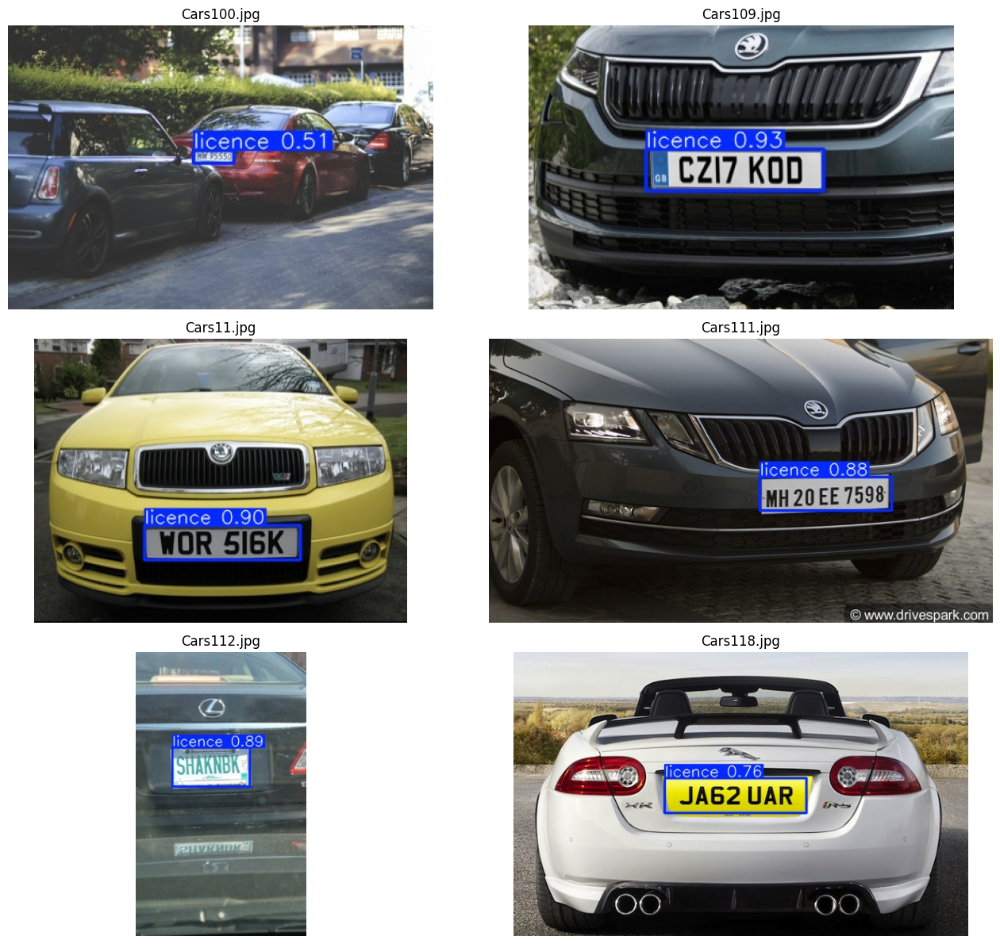

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

def show_images(file_list, cols=2, figsize=(14, 10)):
    n = len(file_list)
    rows = (n + cols - 1) // cols
    plt.figure(figsize=figsize)

    for i, img_path in enumerate(file_list, 1):
        img = Image.open(img_path)
        plt.subplot(rows, cols, i)
        plt.imshow(img)
        plt.title(img_path.name)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

show_images(pred_files[:6], cols=2, figsize=(14, 12))

We will checkout some good and bad cases

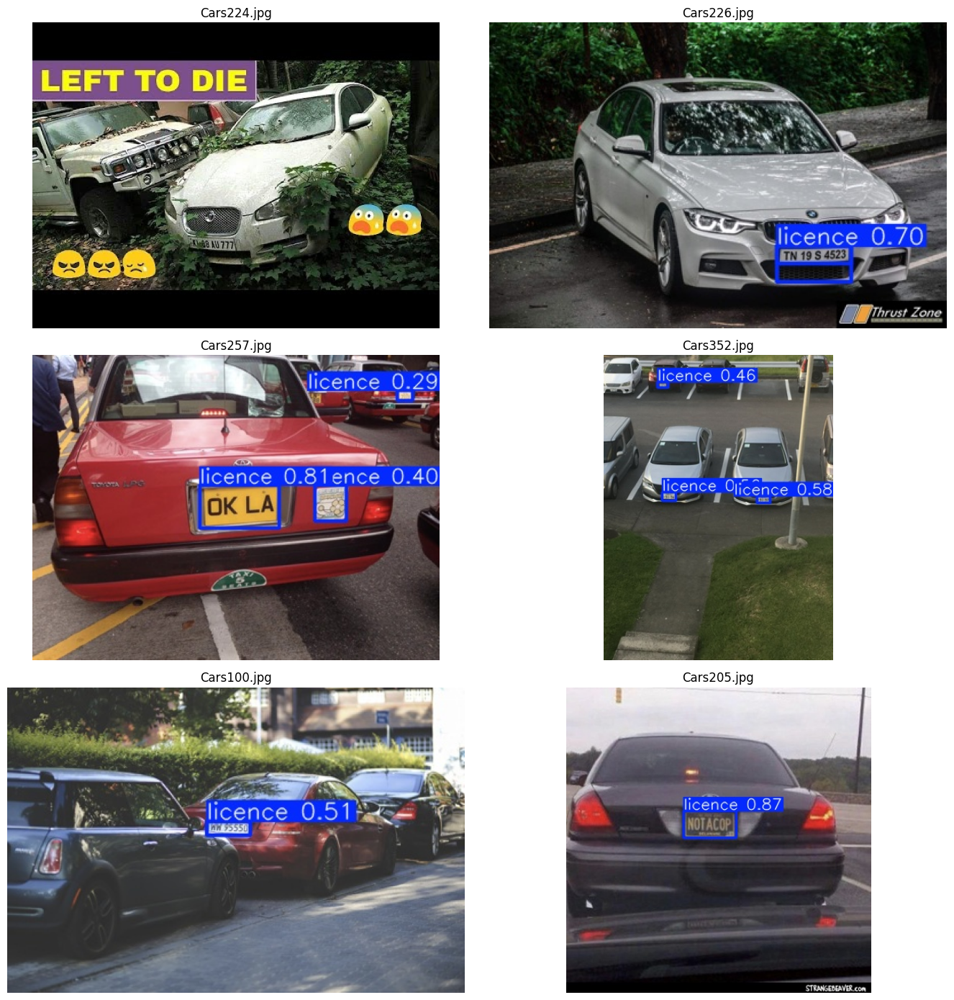

In [ ]:
interesting_names = [
    "Cars224.jpg",  # no detections
    "Cars226.jpg",  # 2 detections
    "Cars257.jpg",  # 3 detections
    "Cars352.jpg",  # 3 detections
    "Cars100.jpg",  # normal success
    "Cars205.jpg"   # normal success
]

interesting_files = [predict_dir / name for name in interesting_names if (predict_dir / name).exists()]
show_images(interesting_files, cols=2, figsize=(14, 14))

original images are in png, predicted images are in jpg

From the prediction results, we can already observe that the model learned the task reasonably well. In several standard cases such as Cars226, Cars100, and Cars205, the detector correctly localizes the license plate with a fairly tight bounding box. This suggests that the baseline YOLO model is effective on normal front or rear car views where the plate is visible, centered enough, and not too small.

At the same time, the harder images reveal the model’s main limitations. In Cars224, the detector failed completely, which is likely due to the cluttered scene, unusual image composition, text overlay, and the relatively small and partially obscured plate. In Cars257, the model detects the main plate but also produces extra lower-confidence detections, suggesting confusion in crowded scenes and possible false positives. In Cars352, the scene contains far-away vehicles with small plates, and the detections are weaker, showing that small distant plates remain challenging.

Confidence values also tell an important story. In easier and cleaner cases, confidence is usually higher, often around 0.7 to 0.9, which suggests the model is more certain when the plate is clear and prominent. In harder cases, confidence drops, often to around 0.4 to 0.5, and some extra detections appear with even lower confidence. This indicates that confidence can help us distinguish between strong detections and more uncertain or suspicious ones.

Overall, the pattern is clear: the model performs well on clear, standard vehicle images with medium-to-large visible plates, but struggles more in difficult conditions such as cluttered backgrounds, unusual compositions, multi-car scenes, and small or distant plates. This suggests that the main weakness is not basic plate recognition, but robustness in harder visual scenarios. A reasonable next improvement would be to keep the same setup and try a slightly larger input size, since increasing imgsz may help preserve more detail for small and far-away plates.

#Confidence Scores from the predictions

We will collect all confidence scores from the predictions

In [ ]:
all_confidences = []
prediction_summary = []

for result in predict_results:
    image_name = result.path.split("/")[-1]
    boxes = result.boxes

    if boxes is None or len(boxes) == 0:
        prediction_summary.append((image_name, 0, []))
        continue

    confs = boxes.conf.cpu().numpy().tolist()
    all_confidences.extend(confs)
    prediction_summary.append((image_name, len(confs), confs))

print("Total predicted boxes:", len(all_confidences))
print("Images processed:", len(prediction_summary))

Total predicted boxes: 77
Images processed: 65


Some confidence statistics

In [ ]:
import numpy as np

if all_confidences:
    conf_array = np.array(all_confidences)
    print("Min confidence:", round(conf_array.min(), 4))
    print("Max confidence:", round(conf_array.max(), 4))
    print("Mean confidence:", round(conf_array.mean(), 4))
    print("Median confidence:", round(np.median(conf_array), 4))
else:
    print("No detections found.")

Min confidence: 0.2842
Max confidence: 0.9254
Mean confidence: 0.695
Median confidence: 0.74


Confidence threshold counts

In [ ]:
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for t in thresholds:
    count = sum(c >= t for c in all_confidences)
    print(f"Detections with confidence >= {t}: {count}")

Detections with confidence >= 0.3: 75
Detections with confidence >= 0.4: 69
Detections with confidence >= 0.5: 64
Detections with confidence >= 0.6: 58
Detections with confidence >= 0.7: 46
Detections with confidence >= 0.8: 28
Detections with confidence >= 0.9: 2


Lowest confidence detections

In [ ]:
low_conf_examples = []

for image_name, num_boxes, confs in prediction_summary:
    for c in confs:
        low_conf_examples.append((image_name, c))

low_conf_examples = sorted(low_conf_examples, key=lambda x: x[1])

print("10 lowest-confidence detections:")
for item in low_conf_examples[:10]:
    print(item)

10 lowest-confidence detections:
('Cars90.png', 0.28422799706459045)
('Cars257.png', 0.2873075306415558)
('Cars388.png', 0.31668442487716675)
('Cars138.png', 0.3336777091026306)
('Cars383.png', 0.37874287366867065)
('Cars257.png', 0.39855778217315674)
('Cars265.png', 0.3992365896701813)
('Cars393.png', 0.3992365896701813)
('Cars59.png', 0.4230039417743683)
('Cars421.png', 0.4412917196750641)


Highest confidence detections

In [ ]:
high_conf_examples = sorted(low_conf_examples, key=lambda x: x[1], reverse=True)

print("10 highest-confidence detections:")
for item in high_conf_examples[:10]:
    print(item)

10 highest-confidence detections:
('Cars109.png', 0.9253997206687927)
('Cars11.png', 0.9013178944587708)
('Cars19.png', 0.8953503370285034)
('Cars112.png', 0.8902101516723633)
('Cars199.png', 0.8759188055992126)
('Cars210.png', 0.8759188055992126)
('Cars111.png', 0.8750258684158325)
('Cars205.png', 0.8714551329612732)
('Cars255.png', 0.863727331161499)
('Cars377.png', 0.857998251914978)


We will display the lowest 3 confidence images, and the lowest 3 of the top 10 images with highest confidence.

In [ ]:
selected_low = [name for name, conf in low_conf_examples[:3]]

top10_high = high_conf_examples[:10]
selected_from_top10 = [name for name, conf in sorted(top10_high, key=lambda x: x[1])[:3]]

selected_names = selected_low + selected_from_top10
print("Selected images:")
for name in selected_names:
    print(name)

Selected images:
Cars90.png
Cars257.png
Cars388.png
Cars377.png
Cars255.png
Cars205.png


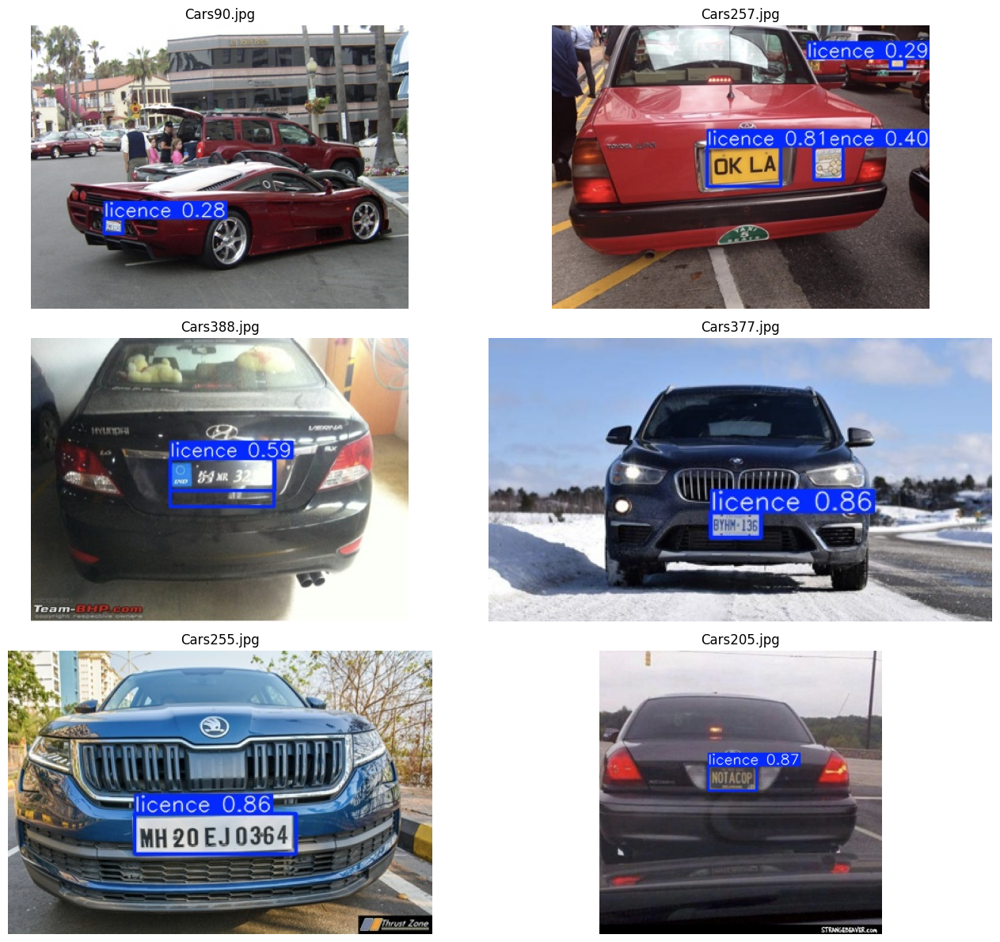

In [ ]:
selected_files = [predict_dir / name.replace(".png", ".jpg") for name in selected_names if (predict_dir / name.replace(".png", ".jpg")).exists()]
show_images(selected_files, cols=2, figsize=(14, 12))

Confidence analysis supports the visual inspection results. High-confidence detections tend to occur in clearer, more standard vehicle images where the license plate is larger, well positioned, and easy to distinguish. Lower-confidence detections appear more often in harder scenes involving smaller plates, angled views, cluttered surroundings, or ambiguous rectangular regions. This suggests that the model’s uncertainty increases mainly in visually complex or small-object scenarios, which is consistent with the moderate mAP50-95 and the observed failure cases.

#Graphs

Load training history

In [ ]:
import pandas as pd

yolo_baseline_results_csv = OUTPUTS_TRAIN_DIR / "yolo_baseline" / "results.csv"

print("Results CSV path:", yolo_baseline_results_csv)
print("Exists:", yolo_baseline_results_csv.exists())

history_df = pd.read_csv(yolo_baseline_results_csv)
history_df.columns = [c.strip() for c in history_df.columns]

print("Columns:")
for c in history_df.columns:
    print("-", c)

history_df.head()

Results CSV path: /content/drive/MyDrive/LicensePlateProject/outputs/train/yolo_baseline/results.csv
Exists: True
Columns:
- epoch
- time
- train/box_loss
- train/cls_loss
- train/dfl_loss
- metrics/precision(B)
- metrics/recall(B)
- metrics/mAP50(B)
- metrics/mAP50-95(B)
- val/box_loss
- val/cls_loss
- val/dfl_loss
- lr/pg0
- lr/pg1
- lr/pg2


,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,14.1514,1.53526,3.32924,1.36810,0.00328,0.90141,0.28475,0.15534,1.40543,3.59958,1.34449,0.000360,0.000360,0.000360
1,2,22.6948,1.45529,2.00693,1.20636,0.00328,0.90141,0.30265,0.16052,1.17709,3.27248,1.14424,0.000711,0.000711,0.000711
2,3,34.8784,1.43993,1.82363,1.22926,0.35784,0.14924,0.15458,0.06913,1.47678,3.31253,1.47759,0.001031,0.001031,0.001031
3,4,43.4900,1.47353,1.80357,1.25072,0.11328,0.18310,0.07361,0.03145,1.57050,3.35092,1.74016,0.001322,0.001322,0.001322
4,5,56.1138,1.54039,1.68684,1.30207,0.16549,0.19718,0.06586,0.02185,2.05980,4.71198,1.74376,0.001582,0.001582,0.001582


Plotting training loss vs epoch

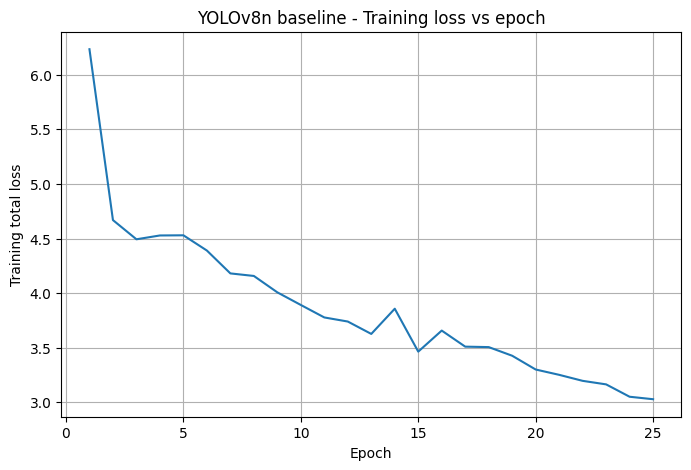

In [ ]:
import matplotlib.pyplot as plt

# YOLO detection losses usually include these columns
train_loss_cols = [c for c in history_df.columns if c in ["train/box_loss", "train/cls_loss", "train/dfl_loss"]]

history_df["train/total_loss"] = history_df[train_loss_cols].sum(axis=1)

plt.figure(figsize=(8, 5))
plt.plot(history_df["epoch"], history_df["train/total_loss"])
plt.xlabel("Epoch")
plt.ylabel("Training total loss")
plt.title("YOLOv8n baseline - Training loss vs epoch")
plt.grid(True)
plt.show()

This graph shows how the model’s training loss changes across the 25 epochs.

* x-axis: epoch number
* y-axis: training total loss
* unit: no physical unit. This is a unitless training objective, not meters, pixels, or plain MSE. It is the sum of YOLO’s training loss components, mainly box loss, classification loss, and DFL loss.


* The training loss starts high, around 6.2, then decreases overall until it reaches about 3.0 by the final epoch. There are a few small fluctuations in the middle, but the overall trend is clearly downward.

* This means the model is learning from the training data and improving its fit over time. Since the loss decreases steadily and significantly, the model is not stuck and does not appear to be obviously underfitting. We can conclude that the optimization process is working properly.

Plotting validation mAP50-95  vs epoch

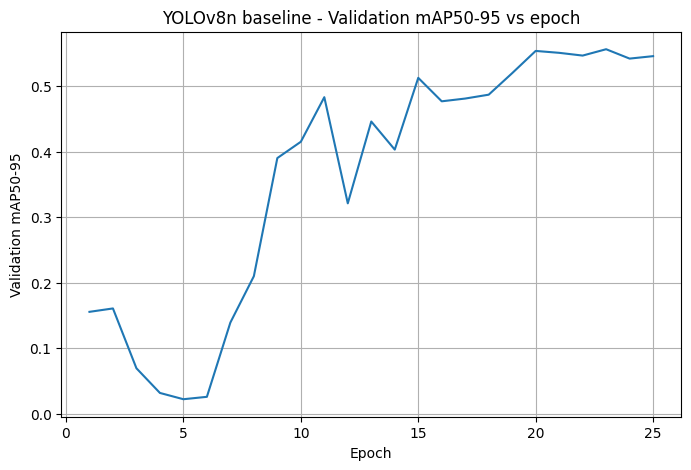

In [ ]:
val_map_col = "metrics/mAP50-95(B)"

plt.figure(figsize=(8, 5))
plt.plot(history_df["epoch"], history_df[val_map_col])
plt.xlabel("Epoch")
plt.ylabel("Validation mAP50-95")
plt.title("YOLOv8n baseline - Validation mAP50-95 vs epoch")
plt.grid(True)
plt.show()

This graph shows how the model’s validation mAP50-95 changes during training.

* x-axis: epoch number

* y-axis: validation mAP50-95
unit: no physical unit. mAP50-95 is a score between 0 and 1. Higher values are better.

* The validation mAP50-95 begins at a low level, drops slightly in the early epochs, then rises strongly after that. It reaches its best value of about 0.5565 around epoch 23, and then decreases slightly to about 0.5459 at the final epoch.

* We can conclude that the model’s performance on unseen validation images improves substantially during training. That means the model is not only learning the training data, but also generalizing better to new images. The small drop after the best epoch suggests that the model may have started to plateau near the end, but the decline is weak. This is not strong evidence of overfitting.

Validation curves

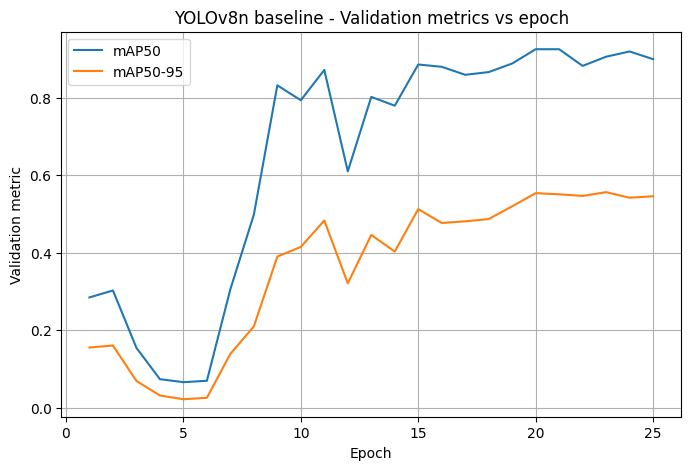

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(history_df["epoch"], history_df["metrics/mAP50(B)"], label="mAP50")
plt.plot(history_df["epoch"], history_df["metrics/mAP50-95(B)"], label="mAP50-95")
plt.xlabel("Epoch")
plt.ylabel("Validation metric")
plt.title("YOLOv8n baseline - Validation metrics vs epoch")
plt.legend()
plt.grid(True)
plt.show()

This graph shows two validation metrics together:

* mAP50
* mAP50-95

The axes:
* x-axis: epoch number
* y-axis: validation metric value
* unit: no physical unit. Both are scores between 0 and 1, where higher is better.

What we understood from the graphs:
* Both curves improve over time, especially after the early epochs. The mAP50 curve stays noticeably higher than the mAP50-95 curve throughout training. Near the end, mAP50 reaches around 0.90, while mAP50-95 reaches around 0.55.

* This difference is expected. mAP50 is a more forgiving metric because it accepts looser bounding boxes, while mAP50-95 is stricter because it averages performance across harder IoU thresholds. Since mAP50 is much higher than mAP50-95, the model is clearly good at detecting that a license plate is present, but its box localization is less strong when stricter precision is required. In other words, the model detects plates well, but there is still room for improvement in tighter localization.







Interpretation

In [ ]:
best_epoch_idx = history_df["metrics/mAP50-95(B)"].idxmax()
best_epoch = int(history_df.loc[best_epoch_idx, "epoch"])
best_val_map = float(history_df.loc[best_epoch_idx, "metrics/mAP50-95(B)"])

final_epoch = int(history_df["epoch"].iloc[-1])
final_val_map = float(history_df["metrics/mAP50-95(B)"].iloc[-1])

initial_loss = float(history_df["train/total_loss"].iloc[0])
final_loss = float(history_df["train/total_loss"].iloc[-1])

val_gain = best_val_map - float(history_df["metrics/mAP50-95(B)"].iloc[0])
val_drop_after_best = best_val_map - final_val_map
loss_reduction = initial_loss - final_loss

print("Best epoch:", best_epoch)
print("Best validation mAP50-95:", round(best_val_map, 4))
print("Final epoch:", final_epoch)
print("Final validation mAP50-95:", round(final_val_map, 4))
print("Training loss reduction:", round(loss_reduction, 4))
print("Validation drop after best epoch:", round(val_drop_after_best, 4))

if best_val_map < 0.3 and final_loss > 1.0:
    interpretation = "likely underfitting"
    reason = "training loss is still relatively high and validation mAP50-95 remained low."
elif val_drop_after_best > 0.02:
    interpretation = "likely overfitting"
    reason = "training kept progressing, but validation mAP50-95 dropped noticeably after the best epoch."
else:
    interpretation = "reasonably balanced"
    reason = "training loss decreased and validation mAP50-95 improved without a strong late drop."

print("\nInterpretation:", interpretation)
print("Reason:", reason)

Best epoch: 23
Best validation mAP50-95: 0.5565
Final epoch: 25
Final validation mAP50-95: 0.5459
Training loss reduction: 3.2037
Validation drop after best epoch: 0.0106

Interpretation: reasonably balanced
Reason: training loss decreased and validation mAP50-95 improved without a strong late drop.


The YOLOv8n baseline produced strong results on this license plate detection task. On the validation set, it achieved a precision of 0.9383, recall of 0.8565, F1-score of 0.8956, mAP50 of 0.9012, and mAP50-95 of 0.5583. On the test set, the model performed slightly better, with a precision of 0.9446, recall of 0.8857, F1-score of 0.9142, mAP50 of 0.9505, and mAP50-95 of 0.5605. This shows that the baseline already detects license plates well, especially at the easier IoU threshold, while the stricter localization metric remains moderate.

The qualitative prediction analysis supports these numbers. The model performs well on clear and standard vehicle images where the plate is visible, centered, and not too small. It struggles more in difficult situations such as cluttered scenes, unusual image compositions, multi-car scenes, and small or distant plates. This suggests that the main weakness is not basic recognition of license plates, but robustness in harder visual conditions and precise localization in challenging cases.

The confidence analysis gives the same general picture. Across the 65 test images, the model produced 77 predicted boxes. The minimum confidence was 0.2842, the maximum was 0.9254, the mean was 0.695, and the median was 0.74. Most detections were in the moderate-to-high confidence range, which is a good sign. Higher-confidence detections tended to appear in clean and standard scenes, while lower-confidence detections appeared more often in harder cases. This confirms that the model becomes less certain mainly when the plate is small, visually ambiguous, partially obscured, or surrounded by distracting background elements.

The learning behavior of the model also looks healthy. The training loss decreased steadily from about 6.2 at the beginning to about 3.0 by the end, which shows that the model was learning effectively. At the same time, the validation mAP50-95 improved strongly overall and reached its best value of about 0.5565 around epoch 23. After that, the score dropped only slightly to about 0.5459 at the final epoch. This small decline is not strong enough to claim clear overfitting. It is better described as a mild plateau near the end of training.

So the final interpretation is that this baseline is reasonably balanced. It is not clearly underfitting, because both training loss and validation performance improve substantially. It is also not clearly overfitting, because there is no major late collapse in validation performance. The best validation performance appears around epoch 23, which suggests that training beyond about 23 to 24 epochs is probably not very useful for this exact configuration, although 25 epochs is still acceptable and does not cause obvious damage.

Overall, the YOLOv8n baseline is a strong first model for this dataset. It generalizes reasonably well, performs strongly on easier scenes, and gives a solid benchmark for comparison with Faster R-CNN and any later optimized model.

#Switching to R-CNN

##Explaining what is R-CNN and comparing it to YOLO

Faster R-CNN is a two-stage detector, which means it first proposes possible object regions and then classifies and refines them. In this project, we use Faster R-CNN with a ResNet-50 backbone and FPN, which is a strong and widely used detection model, but heavier and slower than YOLO. By contrast, the YOLO model we used, YOLOv8n, is a one-stage detector that predicts bounding boxes and class scores directly in a single pass, making it lighter and faster. So the main difference is that YOLO is designed more for efficiency and real-time use, while Faster R-CNN is designed for more careful region-based detection. For training, we use 20 epochs as the baseline setting for Faster R-CNN. Unlike YOLO, Faster R-CNN does not use the imgsz parameter in the same way, since its preprocessing is handled through the TorchVision detection pipeline rather than YOLO’s resizing setup.

##Understanding the difference between R-CNN and YOLO

In [ ]:
!pip -q install torchmetrics pycocotools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 46.5 MB/s eta 0:00:00


##Preparing files paths

In [ ]:
import os
import json
import random
from pathlib import Path

import numpy as np
import pandas as pd
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from torchmetrics.detection.mean_ap import MeanAveragePrecision

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)
print("Torch:", torch.__version__)
print("Torchvision:", torchvision.__version__)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

FRCNN_RUN_NAME = "fasterrcnn_r50_fpn_v2_baseline"

FRCNN_TRAIN_DIR = OUTPUTS_TRAIN_DIR / FRCNN_RUN_NAME
FRCNN_VAL_DIR = OUTPUTS_VAL_DIR / FRCNN_RUN_NAME
FRCNN_PREDICT_DIR = OUTPUTS_PREDICT_DIR / FRCNN_RUN_NAME

FRCNN_BEST_MODEL_PATH = OUTPUTS_MODELS_DIR / f"{FRCNN_RUN_NAME}_best.pth"
FRCNN_HISTORY_PATH = FRCNN_TRAIN_DIR / "history.csv"
FRCNN_METRICS_JSON_PATH = FRCNN_VAL_DIR / "metrics_summary.json"

for p in [FRCNN_TRAIN_DIR, FRCNN_VAL_DIR, FRCNN_PREDICT_DIR, OUTPUTS_MODELS_DIR]:
    p.mkdir(parents=True, exist_ok=True)

Device: cuda
Torch: 2.10.0+cu128
Torchvision: 0.25.0+cu128


##Small Check on dataset paths

In [ ]:
required_dirs = [
    IMAGES_TRAIN_DIR, IMAGES_VAL_DIR, IMAGES_TEST_DIR,
    LABELS_TRAIN_DIR, LABELS_VAL_DIR, LABELS_TEST_DIR
]

for d in required_dirs:
    if not d.exists():
        raise FileNotFoundError(f"Missing required directory: {d}")

print("All required directories exist.")
print("Train images:", len(list(IMAGES_TRAIN_DIR.glob("*"))))
print("Val images:", len(list(IMAGES_VAL_DIR.glob("*"))))
print("Test images:", len(list(IMAGES_TEST_DIR.glob("*"))))

All required directories exist.
Train images: 303
Val images: 65
Test images: 65


##Dataset class

In [ ]:
IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

class LicensePlateFRCNNDataset(Dataset):
    def __init__(self, images_dir, labels_dir):
        self.images_dir = Path(images_dir)
        self.labels_dir = Path(labels_dir)

        self.image_paths = sorted(
            [p for p in self.images_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
        )

        if len(self.image_paths) == 0:
            raise ValueError(f"No images found in {self.images_dir}")

    def __len__(self):
        return len(self.image_paths)

    def _read_yolo_boxes(self, label_path, width, height):
        boxes = []
        labels = []

        if not label_path.exists():
            return (
                torch.zeros((0, 4), dtype=torch.float32),
                torch.zeros((0,), dtype=torch.int64)
            )

        with open(label_path, "r") as f:
            lines = [line.strip() for line in f.readlines() if line.strip()]

        for line in lines:
            parts = line.split()
            if len(parts) != 5:
                continue

            cls_id, x_center, y_center, box_w, box_h = map(float, parts)

            x_center *= width
            y_center *= height
            box_w *= width
            box_h *= height

            x1 = x_center - box_w / 2.0
            y1 = y_center - box_h / 2.0
            x2 = x_center + box_w / 2.0
            y2 = y_center + box_h / 2.0

            x1 = max(0, min(x1, width - 1))
            y1 = max(0, min(y1, height - 1))
            x2 = max(0, min(x2, width - 1))
            y2 = max(0, min(y2, height - 1))

            if x2 > x1 and y2 > y1:
                boxes.append([x1, y1, x2, y2])
                labels.append(1)  # 0 is background, 1 is license plate

        if len(boxes) == 0:
            return (
                torch.zeros((0, 4), dtype=torch.float32),
                torch.zeros((0,), dtype=torch.int64)
            )

        return torch.tensor(boxes, dtype=torch.float32), torch.tensor(labels, dtype=torch.int64)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label_path = self.labels_dir / f"{image_path.stem}.txt"

        image = Image.open(image_path).convert("RGB")
        width, height = image.size

        boxes, labels = self._read_yolo_boxes(label_path, width, height)

        image_tensor = torchvision.transforms.functional.pil_to_tensor(image).float() / 255.0

        area = (
            (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])
            if len(boxes) > 0
            else torch.zeros((0,), dtype=torch.float32)
        )

        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([idx], dtype=torch.int64),
            "area": area,
            "iscrowd": iscrowd
        }

        return image_tensor, target, image_path.name

##Dataloaders

In [ ]:
def frcnn_collate_fn(batch):
    images, targets, names = zip(*batch)
    return list(images), list(targets), list(names)

frcnn_train_dataset = LicensePlateFRCNNDataset(IMAGES_TRAIN_DIR, LABELS_TRAIN_DIR)
frcnn_val_dataset = LicensePlateFRCNNDataset(IMAGES_VAL_DIR, LABELS_VAL_DIR)
frcnn_test_dataset = LicensePlateFRCNNDataset(IMAGES_TEST_DIR, LABELS_TEST_DIR)

FRCNN_BATCH_SIZE = 2
FRCNN_NUM_WORKERS = 2

frcnn_train_loader = DataLoader(
    frcnn_train_dataset,
    batch_size=FRCNN_BATCH_SIZE,
    shuffle=True,
    num_workers=FRCNN_NUM_WORKERS,
    collate_fn=frcnn_collate_fn
)

frcnn_val_loader = DataLoader(
    frcnn_val_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=FRCNN_NUM_WORKERS,
    collate_fn=frcnn_collate_fn
)

frcnn_test_loader = DataLoader(
    frcnn_test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=FRCNN_NUM_WORKERS,
    collate_fn=frcnn_collate_fn
)

print("Train batches:", len(frcnn_train_loader))
print("Val batches:", len(frcnn_val_loader))
print("Test batches:", len(frcnn_test_loader))

Train batches: 152
Val batches: 65
Test batches: 65


##Build the model

In [ ]:
def get_frcnn_model(num_classes=2):
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)

    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

frcnn_model = get_frcnn_model(num_classes=2).to(device)
print("Faster R-CNN model created successfully.")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


100%|██████████| 167M/167M [00:04<00:00, 37.3MB/s]


Faster R-CNN model created successfully.


##Optimizer, scheduler, AMP

In [ ]:
frcnn_params = [p for p in frcnn_model.parameters() if p.requires_grad]

frcnn_optimizer = torch.optim.SGD(
    frcnn_params,
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

frcnn_scheduler = torch.optim.lr_scheduler.StepLR(
    frcnn_optimizer,
    step_size=8,
    gamma=0.1
)

frcnn_use_amp = torch.cuda.is_available()
frcnn_scaler = torch.amp.GradScaler("cuda", enabled=frcnn_use_amp)

FRCNN_NUM_EPOCHS = 20

##Training helpers

In [ ]:
def move_targets_to_device(targets, device):
    moved_targets = []
    for t in targets:
        moved_targets.append({k: v.to(device) for k, v in t.items()})
    return moved_targets

In [ ]:
def train_frcnn_one_epoch(model, loader, optimizer, device, scaler, use_amp):
    model.train()
    running_loss = 0.0

    for images, targets, _ in loader:
        images = [img.to(device) for img in images]
        targets = move_targets_to_device(targets, device)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast("cuda", enabled=use_amp):
            loss_dict = model(images, targets)
            total_loss = sum(loss for loss in loss_dict.values())

        scaler.scale(total_loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += total_loss.item()

    return running_loss / max(len(loader), 1)

In [ ]:
@torch.no_grad()
def evaluate_frcnn_map(model, loader, device, split_name="val"):
    model.eval()

    metric = MeanAveragePrecision(box_format="xyxy", iou_type="bbox")

    for images, targets, _ in loader:
        images = [img.to(device) for img in images]
        outputs = model(images)

        preds_for_metric = []
        targets_for_metric = []

        for output, target in zip(outputs, targets):
            preds_for_metric.append({
                "boxes": output["boxes"].detach().cpu(),
                "scores": output["scores"].detach().cpu(),
                "labels": (output["labels"].detach().cpu() - 1).clamp(min=0)
            })

            targets_for_metric.append({
                "boxes": target["boxes"].detach().cpu(),
                "labels": (target["labels"].detach().cpu() - 1).clamp(min=0)
            })

        metric.update(preds_for_metric, targets_for_metric)

    results = metric.compute()

    clean_results = {}
    for k, v in results.items():
        if isinstance(v, torch.Tensor):
            clean_results[k] = float(v.detach().cpu().item()) if v.numel() == 1 else v.detach().cpu().tolist()
        else:
            clean_results[k] = v

    print(f"\n{split_name.upper()} metrics")
    print(f"mAP50-95: {clean_results.get('map', None):.4f}")
    print(f"mAP50   : {clean_results.get('map_50', None):.4f}")
    print(f"mAP75   : {clean_results.get('map_75', None):.4f}")
    if "mar_100" in clean_results:
        print(f"mAR100  : {clean_results.get('mar_100', None):.4f}")

    return clean_results

##Training

In [ ]:
frcnn_history = []
frcnn_best_val_map = -1.0

for epoch in range(1, FRCNN_NUM_EPOCHS + 1):
    print(f"\nEpoch {epoch}/{FRCNN_NUM_EPOCHS}")

    frcnn_train_loss = train_frcnn_one_epoch(
        frcnn_model,
        frcnn_train_loader,
        frcnn_optimizer,
        device,
        frcnn_scaler,
        frcnn_use_amp
    )

    frcnn_val_metrics = evaluate_frcnn_map(
        frcnn_model,
        frcnn_val_loader,
        device,
        split_name="val"
    )

    frcnn_row = {
        "epoch": epoch,
        "train_loss": frcnn_train_loss,
        "val_map_50_95": frcnn_val_metrics.get("map", None),
        "val_map_50": frcnn_val_metrics.get("map_50", None),
        "val_map_75": frcnn_val_metrics.get("map_75", None),
        "val_mar_100": frcnn_val_metrics.get("mar_100", None),
        "lr": frcnn_optimizer.param_groups[0]["lr"]
    }

    frcnn_history.append(frcnn_row)
    pd.DataFrame(frcnn_history).to_csv(FRCNN_HISTORY_PATH, index=False)

    current_val_map = frcnn_val_metrics.get("map", -1.0)
    if current_val_map is not None and current_val_map > frcnn_best_val_map:
        frcnn_best_val_map = current_val_map
        torch.save(frcnn_model.state_dict(), FRCNN_BEST_MODEL_PATH)
        print(f"Best model updated and saved to: {FRCNN_BEST_MODEL_PATH}")

    frcnn_scheduler.step()

print("\nFaster R-CNN training finished.")
print("Best validation mAP50-95:", frcnn_best_val_map)


Epoch 1/20

VAL metrics
mAP50-95: 0.5129
mAP50   : 0.9206
mAP75   : 0.5284
mAR100  : 0.6239
Best model updated and saved to: /content/drive/MyDrive/LicensePlateProject/outputs/models/fasterrcnn_r50_fpn_v2_baseline_best.pth

Epoch 2/20

VAL metrics
mAP50-95: 0.5900
mAP50   : 0.9597
mAP75   : 0.5903
mAR100  : 0.6775
Best model updated and saved to: /content/drive/MyDrive/LicensePlateProject/outputs/models/fasterrcnn_r50_fpn_v2_baseline_best.pth

Epoch 3/20

VAL metrics
mAP50-95: 0.5575
mAP50   : 0.9670
mAP75   : 0.5337
mAR100  : 0.6507

Epoch 4/20

VAL metrics
mAP50-95: 0.5567
mAP50   : 0.9644
mAP75   : 0.5416
mAR100  : 0.6366

Epoch 5/20

VAL metrics
mAP50-95: 0.5061
mAP50   : 0.9201
mAP75   : 0.5216
mAR100  : 0.5986

Epoch 6/20

VAL metrics
mAP50-95: 0.5510
mAP50   : 0.9567
mAP75   : 0.5969
mAR100  : 0.6324

Epoch 7/20

VAL metrics
mAP50-95: 0.5271
mAP50   : 0.8987
mAP75   : 0.5532
mAR100  : 0.6056

Epoch 8/20

VAL metrics
mAP50-95: 0.5148
mAP50   : 0.9232
mAP75   : 0.5461
mAR100  : 0

##Load again after session ended

In [ ]:
frcnn_best_model = get_frcnn_model(num_classes=2).to(device)
frcnn_best_model.load_state_dict(torch.load(FRCNN_BEST_MODEL_PATH, map_location=device))
frcnn_best_model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       

## Explaining what we did till now

Before training the Faster R-CNN model, the dataset and training pipeline were prepared specifically for this architecture. Unlike YOLO, Faster R-CNN does not directly use normalized YOLO text annotations during training, so a custom dataset class was created to read the already prepared train, validation, and test folders from the final split dataset. Each image was loaded from the corresponding images directory, and its annotation file was read from the matching labels directory. The YOLO annotations, which were stored in normalized (x_center, y_center, width, height) format, were converted in memory into the (x1, y1, x2, y2) bounding box format required by Faster R-CNN. This conversion was done at loading time only, so no original files were overwritten and no new permanent annotation dataset had to be created.

After that, separate datasets and dataloaders were created for the training, validation, and test splits. A dataset stores the samples and tells PyTorch how to read one image and its target at a time, while a dataloader takes that dataset and feeds it to the model in batches during training or evaluation. In other words, the dataset defines what the data is, and the dataloader defines how it is delivered to the model. The training dataloader was shuffled so that the model would not always see the images in the same order, which helps learning. The validation and test dataloaders were not shuffled because they are only used for evaluation and should remain stable. A custom collate function was also needed because object detection images do not all contain the same number of bounding boxes, so the default batching method would not work correctly.

For the model itself, a pretrained fasterrcnn_resnet50_fpn_v2 detector was used. This means that the network did not start from random weights. Instead, it started from weights that were already trained on a large detection dataset, so the backbone had already learned useful visual patterns such as edges, shapes, textures, and object structure. That gives the model a much better starting point than training from scratch, especially when the project dataset is relatively small. However, the original prediction head of the pretrained model was designed for many classes, while this project only needs one real object class: the license plate. Because of that, the old head was replaced with a new one configured for two classes in total: background and license plate. This is the standard Faster R-CNN setup for a single-class detection problem.

For optimization, Stochastic Gradient Descent was used together with momentum, weight decay, and a step-based learning rate scheduler. Stochastic Gradient Descent updates the model weights gradually using batches of data instead of the full dataset at once, which makes training practical and efficient. Momentum was added to make the updates more stable and help the optimizer move in useful directions instead of changing too erratically. Weight decay was included as a regularization method to slightly penalize overly large weights, which can help reduce overfitting and improve generalization. A step-based learning rate scheduler was also used so that the learning rate would decrease after a fixed number of epochs. This is useful because a larger learning rate helps the model make stronger progress early in training, while a smaller learning rate later helps it make more careful refinements. Mixed precision training was enabled when CUDA was available in order to reduce memory usage and speed up computation on the GPU. A helper function was also written to move all target tensors to the selected device so that the images, targets, and model would all be on the same hardware during training.

##Load best model and evaluate on validation/test

In [ ]:
frcnn_best_model = get_frcnn_model(num_classes=2).to(device)
frcnn_best_model.load_state_dict(torch.load(FRCNN_BEST_MODEL_PATH, map_location=device))
frcnn_best_model.eval()

frcnn_val_best_metrics = evaluate_frcnn_map(
    frcnn_best_model,
    frcnn_val_loader,
    device,
    split_name="val_best"
)

frcnn_test_best_metrics = evaluate_frcnn_map(
    frcnn_best_model,
    frcnn_test_loader,
    device,
    split_name="test_best"
)

frcnn_summary = {
    "run_name": FRCNN_RUN_NAME,
    "best_model_path": str(FRCNN_BEST_MODEL_PATH),
    "val_metrics": frcnn_val_best_metrics,
    "test_metrics": frcnn_test_best_metrics
}

with open(FRCNN_METRICS_JSON_PATH, "w") as f:
    json.dump(frcnn_summary, f, indent=2)

print("Saved Faster R-CNN metrics summary to:", FRCNN_METRICS_JSON_PATH)


VAL_BEST metrics
mAP50-95: 0.5900
mAP50   : 0.9597
mAP75   : 0.5903
mAR100  : 0.6775

TEST_BEST metrics
mAP50-95: 0.5452
mAP50   : 0.9611
mAP75   : 0.5490
mAR100  : 0.6271
Saved Faster R-CNN metrics summary to: /content/drive/MyDrive/LicensePlateProject/outputs/val/fasterrcnn_r50_fpn_v2_baseline/metrics_summary.json


##Headline metrics

In [ ]:
frcnn_headline_table = pd.DataFrame([
    {
        "model": "Faster R-CNN baseline",
        "split": "validation",
        "precision": None,
        "recall": None,
        "f1_score": None,
        "map50": frcnn_val_best_metrics.get("map_50", None),
        "map50_95": frcnn_val_best_metrics.get("map", None),
        "map75": frcnn_val_best_metrics.get("map_75", None),
        "mar100": frcnn_val_best_metrics.get("mar_100", None),
    },
    {
        "model": "Faster R-CNN baseline",
        "split": "test",
        "precision": None,
        "recall": None,
        "f1_score": None,
        "map50": frcnn_test_best_metrics.get("map_50", None),
        "map50_95": frcnn_test_best_metrics.get("map", None),
        "map75": frcnn_test_best_metrics.get("map_75", None),
        "mar100": frcnn_test_best_metrics.get("mar_100", None),
    }
])

display(frcnn_headline_table)

,model,split,precision,recall,f1_score,map50,map50_95,map75,mar100
0,Faster R-CNN baseline,validation,None,None,None,0.959688,0.589980,0.590278,0.677465
1,Faster R-CNN baseline,test,None,None,None,0.961132,0.545156,0.549030,0.627143


We are going to have to compute precision, recall and f1-score.
We are going to choose the score threshold on the validation set by maximizing F1, then use that same threshold on the test set. (the threshold is the confidence score threshold)

This way we avoid tuning directly on test set AND we fairly compare the f1-score with the yolo f1-score.

#IoU + precision/recall/F1 computation

In [ ]:
def compute_iou_xyxy(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0.0, x2 - x1)
    inter_h = max(0.0, y2 - y1)
    inter_area = inter_w * inter_h

    area1 = max(0.0, box1[2] - box1[0]) * max(0.0, box1[3] - box1[1])
    area2 = max(0.0, box2[2] - box2[0]) * max(0.0, box2[3] - box2[1])

    union = area1 + area2 - inter_area
    if union <= 0:
        return 0.0

    return inter_area / union

In [ ]:
@torch.no_grad()
def evaluate_frcnn_precision_recall_f1(model, loader, device, split_name="val", score_threshold=0.50, iou_threshold=0.50):
    model.eval()

    total_tp = 0
    total_fp = 0
    total_fn = 0

    for images, targets, _ in loader:
        images_device = [img.to(device) for img in images]
        outputs = model(images_device)

        for output, target in zip(outputs, targets):
            pred_boxes = output["boxes"].detach().cpu()
            pred_scores = output["scores"].detach().cpu()
            pred_labels = output["labels"].detach().cpu()

            gt_boxes = target["boxes"].detach().cpu()
            gt_labels = target["labels"].detach().cpu()

            keep = pred_scores >= score_threshold
            pred_boxes = pred_boxes[keep]
            pred_scores = pred_scores[keep]
            pred_labels = pred_labels[keep]

            matched_gt = set()

            for pred_box, pred_label in zip(pred_boxes, pred_labels):
                best_iou = 0.0
                best_gt_idx = -1

                for gt_idx, (gt_box, gt_label) in enumerate(zip(gt_boxes, gt_labels)):
                    if gt_idx in matched_gt:
                        continue
                    if int(pred_label.item()) != int(gt_label.item()):
                        continue

                    iou = compute_iou_xyxy(pred_box.tolist(), gt_box.tolist())
                    if iou > best_iou:
                        best_iou = iou
                        best_gt_idx = gt_idx

                if best_iou >= iou_threshold and best_gt_idx != -1:
                    total_tp += 1
                    matched_gt.add(best_gt_idx)
                else:
                    total_fp += 1

            total_fn += len(gt_boxes) - len(matched_gt)

    precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0.0
    recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0.0
    f1_score = (2 * precision * recall / (precision + recall)) if (precision + recall) > 0 else 0.0

    return {
        "split": split_name,
        "score_threshold": score_threshold,
        "iou_threshold": iou_threshold,
        "tp": total_tp,
        "fp": total_fp,
        "fn": total_fn,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
    }

##Choose best threshold on validation

In [ ]:
candidate_thresholds = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.60, 0.65, 0.70]

frcnn_threshold_search = []

for thr in candidate_thresholds:
    result = evaluate_frcnn_precision_recall_f1(
        frcnn_best_model,
        frcnn_val_loader,
        device,
        split_name="validation",
        score_threshold=thr,
        iou_threshold=0.50
    )
    frcnn_threshold_search.append(result)

frcnn_threshold_df = pd.DataFrame(frcnn_threshold_search).sort_values("f1_score", ascending=False).reset_index(drop=True)
display(frcnn_threshold_df)

,split,score_threshold,iou_threshold,tp,fp,fn,precision,recall,f1_score
0,validation,0.70,0.5,66,7,5,0.904110,0.929577,0.916667
1,validation,0.65,0.5,66,9,5,0.880000,0.929577,0.904110
2,validation,0.60,0.5,66,11,5,0.857143,0.929577,0.891892
3,validation,0.55,0.5,66,13,5,0.835443,0.929577,0.880000
4,validation,0.50,0.5,66,16,5,0.804878,0.929577,0.862745
5,validation,0.45,0.5,66,18,5,0.785714,0.929577,0.851613
6,validation,0.40,0.5,66,19,5,0.776471,0.929577,0.846154
7,validation,0.35,0.5,68,22,3,0.755556,0.957746,0.844720
8,validation,0.30,0.5,68,25,3,0.731183,0.957746,0.829268
9,validation,0.25,0.5,68,30,3,0.693878,0.957746,0.804734


##Keep the best score

In [ ]:
frcnn_best_threshold = float(frcnn_threshold_df.loc[0, "score_threshold"])

print("Best validation score threshold:", frcnn_best_threshold)
print("Best validation F1:", round(float(frcnn_threshold_df.loc[0, "f1_score"]), 4))

Best validation score threshold: 0.7
Best validation F1: 0.9167


##We will compute the final precision, recall, and F1-score using the best threshold

In [ ]:
frcnn_val_prf = evaluate_frcnn_precision_recall_f1(
    frcnn_best_model,
    frcnn_val_loader,
    device,
    split_name="validation",
    score_threshold=frcnn_best_threshold,   # best confidence threshold from validation
    iou_threshold=0.50                      # IoU matching threshold
)

frcnn_test_prf = evaluate_frcnn_precision_recall_f1(
    frcnn_best_model,
    frcnn_test_loader,
    device,
    split_name="test",
    score_threshold=frcnn_best_threshold,   # same threshold reused on test
    iou_threshold=0.50
)

print("\nValidation PR/F1")
print(f"Score threshold: {frcnn_best_threshold:.2f}")
print(f"IoU threshold:   0.50")
print(f"Precision:       {frcnn_val_prf['precision']:.4f}")
print(f"Recall:          {frcnn_val_prf['recall']:.4f}")
print(f"F1-score:        {frcnn_val_prf['f1_score']:.4f}")

print("\nTest PR/F1")
print(f"Score threshold: {frcnn_best_threshold:.2f}")
print(f"IoU threshold:   0.50")
print(f"Precision:       {frcnn_test_prf['precision']:.4f}")
print(f"Recall:          {frcnn_test_prf['recall']:.4f}")
print(f"F1-score:        {frcnn_test_prf['f1_score']:.4f}")


Validation PR/F1
Precision: 0.9041
Recall:    0.9296
F1-score:  0.9167

Test PR/F1
Precision: 0.8684
Recall:    0.9429
F1-score:  0.9041


##For Predictions
We use score threshold for confidence = 0.5

In [ ]:
from PIL import ImageDraw
import matplotlib.pyplot as plt

FRCNN_VIS_THRESHOLD = 0.50

FRCNN_PREDICT_DIR = PROJECT_ROOT / "outputs" / "predict" / FRCNN_RUN_NAME
FRCNN_PREDICT_DIR.mkdir(parents=True, exist_ok=True)

def draw_frcnn_predictions(image_tensor, output, score_threshold=0.50):
    image = torchvision.transforms.functional.to_pil_image(image_tensor.cpu())
    draw = ImageDraw.Draw(image)

    boxes = output["boxes"].detach().cpu()
    scores = output["scores"].detach().cpu()

    for box, score in zip(boxes, scores):
        if score < score_threshold:
            continue

        x1, y1, x2, y2 = box.tolist()
        draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
        draw.text((x1, max(0, y1 - 12)), f"{score:.2f}", fill="red")

    return image

In [ ]:
@torch.no_grad()
def save_frcnn_prediction_images(model, loader, output_dir, split_name="test", score_threshold=0.50):
    model.eval()
    saved_paths = []

    for images, _, names in loader:
        image = images[0].to(device)
        output = model([image])[0]

        vis = draw_frcnn_predictions(image.cpu(), output, score_threshold=score_threshold)
        save_path = output_dir / f"{split_name}_{names[0]}"
        vis.save(save_path)
        saved_paths.append(save_path)

    print(f"Saved {len(saved_paths)} prediction images to {output_dir}")
    return saved_paths

##Save prediction samples

In [ ]:
frcnn_saved_prediction_paths = save_frcnn_prediction_images(
    frcnn_best_model,
    frcnn_test_loader,
    FRCNN_PREDICT_DIR,
    split_name="test",
    score_threshold=FRCNN_VIS_THRESHOLD
)

len(frcnn_saved_prediction_paths)

Saved 65 prediction images to /content/drive/MyDrive/LicensePlateProject/outputs/predict/fasterrcnn_r50_fpn_v2_baseline


65

##Confidence folder and confidence collection

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path

FRCNN_CONFIDENCE_DIR = FRCNN_VAL_DIR / "confidence_analysis"
FRCNN_CONFIDENCE_DIR.mkdir(parents=True, exist_ok=True)

In [ ]:
@torch.no_grad()
def collect_frcnn_confidence_scores(model, loader, device, split_name="test"):
    model.eval()

    rows = []

    for images, _, names in loader:
        images = [img.to(device) for img in images]
        outputs = model(images)

        for output, image_name in zip(outputs, names):
            scores = output["scores"].detach().cpu().numpy()
            boxes = output["boxes"].detach().cpu().numpy()

            if len(scores) == 0:
                rows.append({
                    "image_name": image_name,
                    "detection_index": -1,
                    "confidence": np.nan,
                    "x1": np.nan,
                    "y1": np.nan,
                    "x2": np.nan,
                    "y2": np.nan
                })
            else:
                for i, (score, box) in enumerate(zip(scores, boxes)):
                    x1, y1, x2, y2 = box.tolist()
                    rows.append({
                        "image_name": image_name,
                        "detection_index": i,
                        "confidence": float(score),
                        "x1": float(x1),
                        "y1": float(y1),
                        "x2": float(x2),
                        "y2": float(y2)
                    })

    df = pd.DataFrame(rows)
    csv_path = FRCNN_CONFIDENCE_DIR / f"{split_name}_confidence_scores.csv"
    df.to_csv(csv_path, index=False)

    print(f"Saved confidence scores to: {csv_path}")
    return df

##Confidence summary

In [ ]:
frcnn_test_conf_df = collect_frcnn_confidence_scores(
    frcnn_best_model,
    frcnn_test_loader,
    device,
    split_name="test"
)

display(frcnn_test_conf_df.head())

Saved confidence scores to: /content/drive/MyDrive/LicensePlateProject/outputs/val/fasterrcnn_r50_fpn_v2_baseline/confidence_analysis/test_confidence_scores.csv


,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars100.png,0,0.907057,174.681717,118.055420,212.958771,130.019592
1,Cars100.png,1,0.089630,155.581070,116.002754,215.018402,131.450638
2,Cars100.png,2,0.057446,266.302032,4.304116,289.610352,17.762716
3,Cars109.png,0,0.973197,111.130424,118.692970,276.950195,154.075806
4,Cars11.png,0,0.963149,120.282669,201.861633,281.540497,235.541641


In [ ]:
frcnn_valid_conf = frcnn_test_conf_df["confidence"].dropna()

frcnn_confidence_stats = {
    "num_predicted_boxes": int(frcnn_valid_conf.shape[0]),
    "num_images_with_no_detection": int(frcnn_test_conf_df["confidence"].isna().sum()),
    "mean_confidence": float(frcnn_valid_conf.mean()) if len(frcnn_valid_conf) > 0 else np.nan,
    "median_confidence": float(frcnn_valid_conf.median()) if len(frcnn_valid_conf) > 0 else np.nan,
    "min_confidence": float(frcnn_valid_conf.min()) if len(frcnn_valid_conf) > 0 else np.nan,
    "max_confidence": float(frcnn_valid_conf.max()) if len(frcnn_valid_conf) > 0 else np.nan,
    "std_confidence": float(frcnn_valid_conf.std()) if len(frcnn_valid_conf) > 1 else np.nan,
}

print("Confidence statistics")
for k, v in frcnn_confidence_stats.items():
    if isinstance(v, float):
        print(f"{k}: {v:.4f}")
    else:
        print(f"{k}: {v}")

Confidence statistics
num_predicted_boxes: 194
num_images_with_no_detection: 0
mean_confidence: 0.4741
median_confidence: 0.3033
min_confidence: 0.0504
max_confidence: 0.9840
std_confidence: 0.3894


##Lowest 10 and highest 10 detections

In [ ]:
frcnn_lowest_10_conf = (
    frcnn_test_conf_df.dropna(subset=["confidence"])
    .sort_values("confidence", ascending=True)
    .head(10)
    .reset_index(drop=True)
)

frcnn_highest_10_conf = (
    frcnn_test_conf_df.dropna(subset=["confidence"])
    .sort_values("confidence", ascending=False)
    .head(10)
    .reset_index(drop=True)
)

print("Top 10 lowest-confidence detections")
display(frcnn_lowest_10_conf)

print("Top 10 highest-confidence detections")
display(frcnn_highest_10_conf)

Top 10 lowest-confidence detections


,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars383.png,4,0.050411,101.416054,238.431076,113.255798,242.268463
1,Cars352.png,6,0.050574,197.250229,183.749969,230.530334,196.138107
2,Cars263.png,3,0.051111,349.408386,27.287838,400.000000,187.307602
3,Cars85.png,5,0.051637,63.633629,78.528214,78.608589,84.672668
4,Cars85.png,4,0.051675,46.870480,78.946983,61.449722,84.907265
5,Cars49.png,4,0.052168,122.278160,114.011368,343.865875,168.632904
6,Cars41.png,1,0.054715,9.211201,49.704632,287.961365,270.190491
7,Cars17.png,4,0.054940,303.697052,179.434036,351.590057,218.641235
8,Cars255.png,2,0.055253,51.279293,83.715477,298.787750,138.609283
9,Cars22.png,8,0.056012,218.803116,44.858143,246.890884,51.145420


Top 10 highest-confidence detections


,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars273.png,0,0.983990,80.243004,134.365112,253.447601,169.272629
1,Cars428.png,0,0.981439,144.215576,127.522491,255.580765,156.930908
2,Cars398.png,0,0.978884,43.140900,132.296585,200.365936,242.452377
3,Cars255.png,0,0.978330,115.715340,156.853317,270.190460,190.066986
4,Cars96.png,0,0.976974,134.711517,125.580429,260.621979,156.677414
5,Cars272.png,0,0.975515,164.087967,88.353638,314.660492,123.098198
6,Cars19.png,0,0.975487,150.427521,194.896576,220.408844,228.582993
7,Cars198.png,0,0.975398,164.849960,222.542130,275.134186,246.185547
8,Cars111.png,0,0.975347,323.938141,166.429062,477.352020,204.801117
9,Cars109.png,0,0.973197,111.130424,118.692970,276.950195,154.075806


In [ ]:
frcnn_lowest_csv = FRCNN_CONFIDENCE_DIR / "test_lowest_10_confidence.csv"
frcnn_highest_csv = FRCNN_CONFIDENCE_DIR / "test_highest_10_confidence.csv"

frcnn_lowest_10_conf.to_csv(frcnn_lowest_csv, index=False)
frcnn_highest_10_conf.to_csv(frcnn_highest_csv, index=False)

print("Saved:")
print(frcnn_lowest_csv)
print(frcnn_highest_csv)

Saved:
/content/drive/MyDrive/LicensePlateProject/outputs/val/fasterrcnn_r50_fpn_v2_baseline/confidence_analysis/test_lowest_10_confidence.csv
/content/drive/MyDrive/LicensePlateProject/outputs/val/fasterrcnn_r50_fpn_v2_baseline/confidence_analysis/test_highest_10_confidence.csv


##Short automatic confidence summary sentence

In [ ]:
print(
    f"The Faster R-CNN model produced {frcnn_confidence_stats['num_predicted_boxes']} predicted boxes on the test set. "
    f"The mean confidence was {frcnn_confidence_stats['mean_confidence']:.4f}, "
    f"the median confidence was {frcnn_confidence_stats['median_confidence']:.4f}, "
    f"the minimum confidence was {frcnn_confidence_stats['min_confidence']:.4f}, "
    f"and the maximum confidence was {frcnn_confidence_stats['max_confidence']:.4f}."
)

The Faster R-CNN model produced 194 predicted boxes on the test set. The mean confidence was 0.4741, the median confidence was 0.3033, the minimum confidence was 0.0504, and the maximum confidence was 0.9840.


##Choose 3 from lowest 10 and 3 from highest 10

In [ ]:
frcnn_selected_low_3 = frcnn_lowest_10_conf.head(3).copy()
frcnn_selected_high_3 = frcnn_highest_10_conf.head(3).copy()

display(frcnn_selected_low_3)
display(frcnn_selected_high_3)

,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars383.png,4,0.050411,101.416054,238.431076,113.255798,242.268463
1,Cars352.png,6,0.050574,197.250229,183.749969,230.530334,196.138107
2,Cars263.png,3,0.051111,349.408386,27.287838,400.000000,187.307602


,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars273.png,0,0.983990,80.243004,134.365112,253.447601,169.272629
1,Cars428.png,0,0.981439,144.215576,127.522491,255.580765,156.930908
2,Cars398.png,0,0.978884,43.140900,132.296585,200.365936,242.452377


##Show the selected images

In [ ]:
import matplotlib.patches as patches
from PIL import Image

def show_frcnn_selected_examples(df, images_dir, title_prefix):
    n = len(df)
    if n == 0:
        print("No images to display.")
        return

    fig, axes = plt.subplots(1, n, figsize=(6 * n, 5))
    if n == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, df.iterrows()):
        image_path = Path(images_dir) / row["image_name"]
        image = Image.open(image_path).convert("RGB")

        ax.imshow(image)

        rect = patches.Rectangle(
            (row["x1"], row["y1"]),
            row["x2"] - row["x1"],
            row["y2"] - row["y1"],
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )
        ax.add_patch(rect)

        ax.set_title(f"{title_prefix}\n{row['image_name']}\nscore={row['confidence']:.2f}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

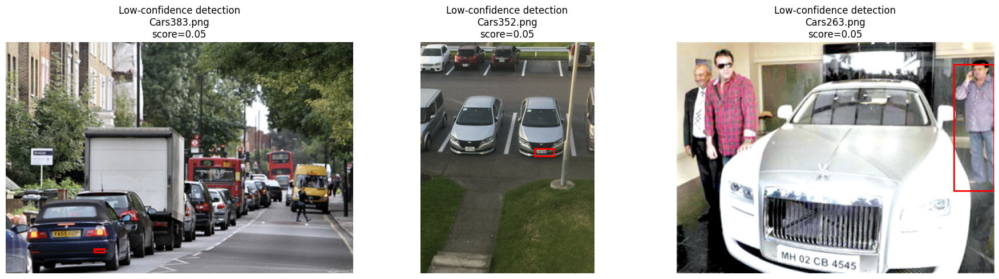

In [ ]:
show_frcnn_selected_examples(
    frcnn_selected_low_3,
    IMAGES_TEST_DIR,
    "Low-confidence detection"
)

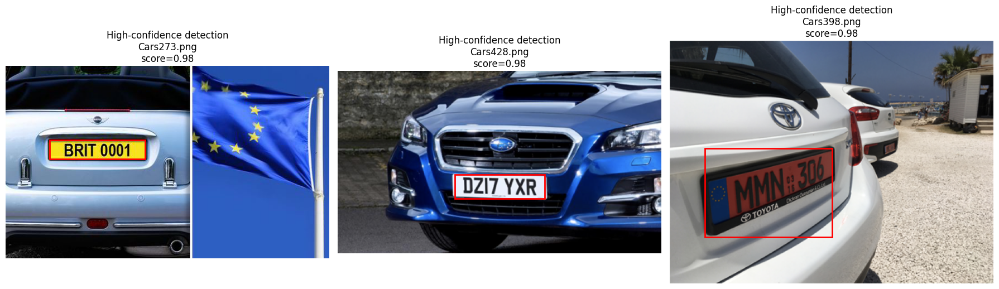

In [ ]:
show_frcnn_selected_examples(
    frcnn_selected_high_3,
    IMAGES_TEST_DIR,
    "High-confidence detection"
)

The Faster R-CNN baseline shows a mixed but meaningful result. On the one hand, it achieves very strong detection performance at the easier threshold, with mAP50 = 0.9597 on validation and 0.9611 on test, which means it is usually able to find the license plate region. However, the stricter metric is more important here: mAP50-95 = 0.5900 on validation but only 0.5452 on test. This drop suggests that although the model fits the validation set well, it does not generalize as strongly to unseen data. This matches the training-curve analysis, where the best validation performance was reached very early and then declined, indicating likely overfitting.

Compared with the YOLOv8n baseline, Faster R-CNN is stronger on validation but not clearly better on the final test set. YOLO achieved mAP50-95 = 0.5583 on validation and 0.5605 on test, while Faster R-CNN achieved 0.5900 on validation and 0.5452 on test. So Faster R-CNN looked better during validation, but YOLO ended up slightly better on the stricter final test metric. At the easier level, Faster R-CNN had a slightly higher test mAP50 than YOLO (0.9611 vs 0.9505), which suggests it is very good at roughly locating plates. But since YOLO had the better test mAP50-95, it appears to generalize a bit better when tighter and more reliable localization is required.

The confidence behavior also supports this comparison. Faster R-CNN produced 194 predicted boxes on the test set, with a mean confidence of 0.4741 and a median confidence of 0.3033, which is quite low overall. In contrast, YOLO produced fewer detections and had noticeably higher confidence on average, with a mean of about 0.695 and a median of 0.74. This suggests that Faster R-CNN is more willing to produce many candidate detections, including weaker ones, while YOLO is more selective and generally more confident. The low-confidence Faster R-CNN examples also show that some weak detections come from difficult scenes or clearly irrelevant regions, while the high-confidence examples show that the model can still localize clean plates very well when the visual conditions are favorable.

So the main conclusion is: Faster R-CNN is a strong detector, especially at coarse detection, but it appears more prone to overfitting and produces noisier predictions than YOLO on this dataset. YOLO is slightly more reliable on the final strict test metric, which makes it the more stable baseline overall.

##Do the graphs

In [ ]:
import pandas as pd

frcnn_history_df = pd.read_csv(FRCNN_HISTORY_PATH)
frcnn_history_df.columns = [c.strip() for c in frcnn_history_df.columns]

print("History path:", FRCNN_HISTORY_PATH)
print("Rows:", len(frcnn_history_df))
display(frcnn_history_df.head())

History path: /content/drive/MyDrive/LicensePlateProject/outputs/train/fasterrcnn_r50_fpn_v2_baseline/history.csv
Rows: 20


,epoch,train_loss,val_map_50_95,val_map_50,val_map_75,val_mar_100,lr
0,1,0.133634,0.512943,0.920589,0.528392,0.623944,0.005
1,2,0.079982,0.589980,0.959688,0.590278,0.677465,0.005
2,3,0.064383,0.557501,0.967004,0.533708,0.650704,0.005
3,4,0.059472,0.556651,0.964404,0.541620,0.636620,0.005
4,5,0.051930,0.506110,0.920138,0.521576,0.598592,0.005


##Training loss vs epoch

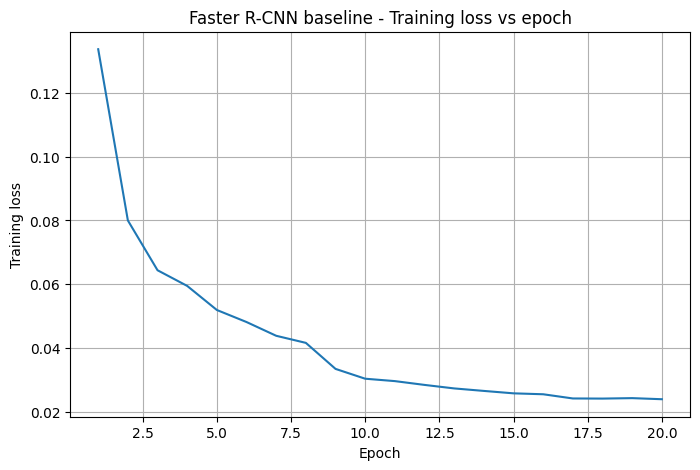

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(frcnn_history_df["epoch"], frcnn_history_df["train_loss"])
plt.xlabel("Epoch")
plt.ylabel("Training loss")
plt.title("Faster R-CNN baseline - Training loss vs epoch")
plt.grid(True)
plt.show()

##Validation mAP50-95 vs epoch

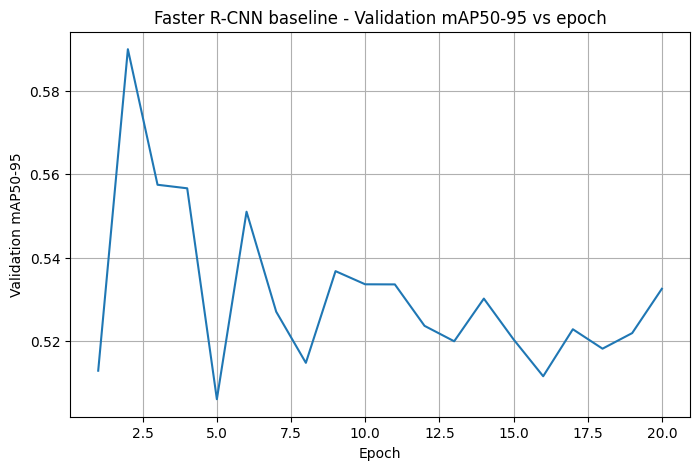

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(frcnn_history_df["epoch"], frcnn_history_df["val_map_50_95"])
plt.xlabel("Epoch")
plt.ylabel("Validation mAP50-95")
plt.title("Faster R-CNN baseline - Validation mAP50-95 vs epoch")
plt.grid(True)
plt.show()

##Validation metrics vs epoch

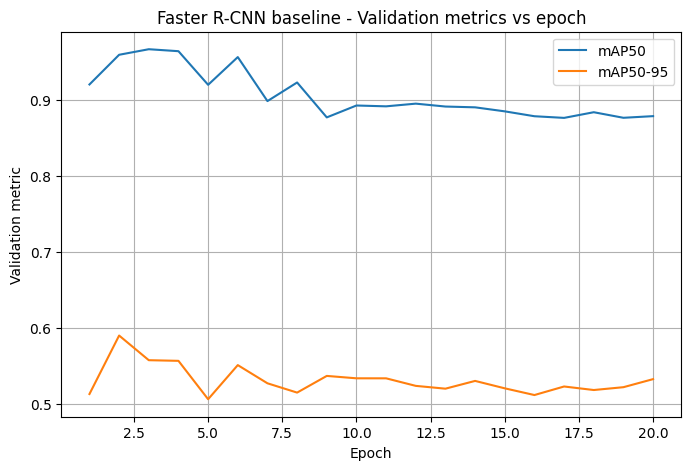

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(frcnn_history_df["epoch"], frcnn_history_df["val_map_50"], label="mAP50")
plt.plot(frcnn_history_df["epoch"], frcnn_history_df["val_map_50_95"], label="mAP50-95")
plt.xlabel("Epoch")
plt.ylabel("Validation metric")
plt.title("Faster R-CNN baseline - Validation metrics vs epoch")
plt.legend()
plt.grid(True)
plt.show()

##Interpretation block

In [ ]:
frcnn_best_epoch_idx = frcnn_history_df["val_map_50_95"].idxmax()
frcnn_best_epoch = int(frcnn_history_df.loc[frcnn_best_epoch_idx, "epoch"])
frcnn_best_val_map = float(frcnn_history_df.loc[frcnn_best_epoch_idx, "val_map_50_95"])

frcnn_final_epoch = int(frcnn_history_df["epoch"].iloc[-1])
frcnn_final_val_map = float(frcnn_history_df["val_map_50_95"].iloc[-1])

frcnn_initial_loss = float(frcnn_history_df["train_loss"].iloc[0])
frcnn_final_loss = float(frcnn_history_df["train_loss"].iloc[-1])

frcnn_loss_reduction = frcnn_initial_loss - frcnn_final_loss
frcnn_val_drop_after_best = frcnn_best_val_map - frcnn_final_val_map

print("Best epoch:", frcnn_best_epoch)
print("Best validation mAP50-95:", round(frcnn_best_val_map, 4))
print("Final epoch:", frcnn_final_epoch)
print("Final validation mAP50-95:", round(frcnn_final_val_map, 4))
print("Training loss reduction:", round(frcnn_loss_reduction, 4))
print("Validation drop after best epoch:", round(frcnn_val_drop_after_best, 4))

if frcnn_best_val_map < 0.3 and frcnn_final_loss > 1.0:
    frcnn_interpretation = "likely underfitting"
    frcnn_reason = "training loss remained relatively high and validation mAP50-95 stayed low."
elif frcnn_val_drop_after_best > 0.02:
    frcnn_interpretation = "likely overfitting"
    frcnn_reason = "training continued, but validation mAP50-95 dropped noticeably after the best epoch."
else:
    frcnn_interpretation = "reasonably balanced"
    frcnn_reason = "training loss decreased and validation mAP50-95 improved without a strong late drop."

print("\nInterpretation:", frcnn_interpretation)
print("Reason:", frcnn_reason)

Best epoch: 2
Best validation mAP50-95: 0.59
Final epoch: 20
Final validation mAP50-95: 0.5326
Training loss reduction: 0.1097
Validation drop after best epoch: 0.0574

Interpretation: likely overfitting
Reason: training continued, but validation mAP50-95 dropped noticeably after the best epoch.


## What we understood from the graphs and comparing them to YOLO

The training loss decreases steadily across epochs, which shows that the Faster R-CNN model continues fitting the training data and improving its optimization over time. However, the validation mAP50-95 tells a different story. It reaches its best value very early, around epoch 2, and then generally declines and fluctuates at a lower level for the rest of training. This means that although the model keeps learning the training data, those improvements do not translate into better validation performance. The combined validation plot shows the same pattern: mAP50 remains high overall, meaning the model can still roughly detect the plate region well, but mAP50-95 stays noticeably lower and drops after the early peak, which suggests weaker generalization when stricter localization is required.

So the overall conclusion is that Faster R-CNN is overfitting on this dataset. The model achieves its best validation performance very early, then continues reducing training loss without maintaining that validation quality. This likely happens because the model is relatively strong and heavy for a small dataset, so it starts memorizing the training set quickly instead of continuing to improve on unseen data. Because of that, the best model was taken from epoch 2, where the validation mAP50-95 reached its maximum value.

# Moving on to RetinaNet

RetinaNet is a one-stage detector, like YOLO, but it was designed to improve one-stage detection using focal loss, which reduces the effect of easy background examples and helps the model focus more on harder foreground objects. In this project, we use retinanet_resnet50_fpn_v2 with pretrained weights. Compared with YOLOv8n, RetinaNet is much larger and heavier, so it may detect more carefully in some cases, but it is also more computationally expensive. We keep the same train, validation, and test splits so the comparison remains fair.

##Import and setup

In [ ]:
import os
import json
from pathlib import Path
from functools import partial

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import pandas as pd

from torchvision.models.detection import retinanet_resnet50_fpn_v2
from torchvision.models.detection import RetinaNet_ResNet50_FPN_V2_Weights
from torchvision.models.detection.retinanet import RetinaNetClassificationHead

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cuda


##Prepare paths

In [ ]:
RETINA_RUN_NAME = "retinanet_r50_fpn_v2_baseline"

RETINA_TRAIN_DIR = OUTPUTS_TRAIN_DIR / RETINA_RUN_NAME
RETINA_VAL_DIR = OUTPUTS_VAL_DIR / RETINA_RUN_NAME
RETINA_PREDICT_DIR = OUTPUTS_PREDICT_DIR / RETINA_RUN_NAME

RETINA_BEST_MODEL_PATH = OUTPUTS_MODELS_DIR / f"{RETINA_RUN_NAME}_best.pth"
RETINA_HISTORY_PATH = RETINA_TRAIN_DIR / "history.csv"
RETINA_METRICS_JSON_PATH = RETINA_VAL_DIR / "metrics_summary.json"

for p in [RETINA_TRAIN_DIR, RETINA_VAL_DIR, RETINA_PREDICT_DIR, OUTPUTS_MODELS_DIR]:
    p.mkdir(parents=True, exist_ok=True)

print("Train dir:", RETINA_TRAIN_DIR)
print("Val dir:", RETINA_VAL_DIR)
print("Predict dir:", RETINA_PREDICT_DIR)
print("Best model path:", RETINA_BEST_MODEL_PATH)

Train dir: /content/drive/MyDrive/LicensePlateProject/outputs/train/retinanet_r50_fpn_v2_baseline
Val dir: /content/drive/MyDrive/LicensePlateProject/outputs/val/retinanet_r50_fpn_v2_baseline
Predict dir: /content/drive/MyDrive/LicensePlateProject/outputs/predict/retinanet_r50_fpn_v2_baseline
Best model path: /content/drive/MyDrive/LicensePlateProject/outputs/models/retinanet_r50_fpn_v2_baseline_best.pth


##Reuse dataset and loaders
we will reuse the dataset and loaders used for R-CNN

In [ ]:
from pathlib import Path
from PIL import Image
import torch
from torch.utils.data import Dataset
import torchvision

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

class LicensePlateFRCNNDataset(Dataset):
    def __init__(self, images_dir, labels_dir):
        self.images_dir = Path(images_dir)
        self.labels_dir = Path(labels_dir)

        self.image_paths = sorted(
            [p for p in self.images_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
        )

        if len(self.image_paths) == 0:
            raise ValueError(f"No images found in {self.images_dir}")

    def __len__(self):
        return len(self.image_paths)

    def _read_yolo_boxes(self, label_path, width, height):
        boxes = []
        labels = []

        if not label_path.exists():
            return (
                torch.zeros((0, 4), dtype=torch.float32),
                torch.zeros((0,), dtype=torch.int64)
            )

        with open(label_path, "r") as f:
            lines = [line.strip() for line in f.readlines() if line.strip()]

        for line in lines:
            parts = line.split()
            if len(parts) != 5:
                continue

            cls_id, x_center, y_center, box_w, box_h = map(float, parts)

            x_center *= width
            y_center *= height
            box_w *= width
            box_h *= height

            x1 = x_center - box_w / 2.0
            y1 = y_center - box_h / 2.0
            x2 = x_center + box_w / 2.0
            y2 = y_center + box_h / 2.0

            x1 = max(0, min(x1, width - 1))
            y1 = max(0, min(y1, height - 1))
            x2 = max(0, min(x2, width - 1))
            y2 = max(0, min(y2, height - 1))

            if x2 > x1 and y2 > y1:
                boxes.append([x1, y1, x2, y2])
                labels.append(1)

        if len(boxes) == 0:
            return (
                torch.zeros((0, 4), dtype=torch.float32),
                torch.zeros((0,), dtype=torch.int64)
            )

        return torch.tensor(boxes, dtype=torch.float32), torch.tensor(labels, dtype=torch.int64)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label_path = self.labels_dir / f"{image_path.stem}.txt"

        image = Image.open(image_path).convert("RGB")
        width, height = image.size

        boxes, labels = self._read_yolo_boxes(label_path, width, height)

        image_tensor = torchvision.transforms.functional.pil_to_tensor(image).float() / 255.0

        area = (
            (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])
            if len(boxes) > 0
            else torch.zeros((0,), dtype=torch.float32)
        )

        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([idx], dtype=torch.int64),
            "area": area,
            "iscrowd": iscrowd
        }

        return image_tensor, target, image_path.name

def collate_fn(batch):
    images, targets, names = zip(*batch)
    return list(images), list(targets), list(names)

In [ ]:
RETINA_BATCH_SIZE = 2
RETINA_NUM_WORKERS = 2

retina_train_dataset = LicensePlateFRCNNDataset(IMAGES_TRAIN_DIR, LABELS_TRAIN_DIR)
retina_val_dataset = LicensePlateFRCNNDataset(IMAGES_VAL_DIR, LABELS_VAL_DIR)
retina_test_dataset = LicensePlateFRCNNDataset(IMAGES_TEST_DIR, LABELS_TEST_DIR)

retina_train_loader = DataLoader(
    retina_train_dataset,
    batch_size=RETINA_BATCH_SIZE,
    shuffle=True,
    num_workers=RETINA_NUM_WORKERS,
    collate_fn=collate_fn
)

retina_val_loader = DataLoader(
    retina_val_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=RETINA_NUM_WORKERS,
    collate_fn=collate_fn
)

retina_test_loader = DataLoader(
    retina_test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=RETINA_NUM_WORKERS,
    collate_fn=collate_fn
)

print("Train images:", len(retina_train_dataset))
print("Val images:", len(retina_val_dataset))
print("Test images:", len(retina_test_dataset))
print("Train batches:", len(retina_train_loader))

Train images: 303
Val images: 65
Test images: 65
Train batches: 152


##Build RetinaNet model

In [ ]:
def get_retinanet_model(num_classes=2):
    weights = RetinaNet_ResNet50_FPN_V2_Weights.DEFAULT
    model = retinanet_resnet50_fpn_v2(weights=weights)

    num_anchors = model.head.classification_head.num_anchors
    in_channels = model.backbone.out_channels

    model.head.classification_head = RetinaNetClassificationHead(
        in_channels,
        num_anchors,
        num_classes,
        norm_layer=partial(nn.GroupNorm, 32)
    )

    return model

retina_model = get_retinanet_model(num_classes=2).to(device)
print("RetinaNet model created successfully.")

Downloading: "https://download.pytorch.org/models/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth" to /root/.cache/torch/hub/checkpoints/retinanet_resnet50_fpn_v2_coco-5905b1c5.pth


100%|██████████| 146M/146M [00:00<00:00, 161MB/s]


RetinaNet model created successfully.


##Optimizer, schelder, and AMP

In [ ]:
retina_params = [p for p in retina_model.parameters() if p.requires_grad]

retina_optimizer = torch.optim.SGD(
    retina_params,
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

retina_scheduler = torch.optim.lr_scheduler.StepLR(
    retina_optimizer,
    step_size=8,
    gamma=0.1
)

RETINA_NUM_EPOCHS = 25
retina_use_amp = torch.cuda.is_available()
retina_scaler = torch.amp.GradScaler("cuda", enabled=retina_use_amp)

##Training helper functions


In [ ]:
def train_retina_one_epoch(model, loader, optimizer, device, scaler):
    model.train()
    running_loss = 0.0

    for images, targets, _ in loader:
        images = [img.to(device) for img in images]
        targets = move_targets_to_device(targets, device)

        optimizer.zero_grad(set_to_none=True)

        with torch.amp.autocast("cuda", enabled=retina_use_amp):
            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()

    return running_loss / max(len(loader), 1)

In [ ]:
from torchmetrics.detection.mean_ap import MeanAveragePrecision

@torch.no_grad()
def evaluate_retina_map(model, loader, device, split_name="val"):
    model.eval()
    metric = MeanAveragePrecision(box_format="xyxy", iou_type="bbox")

    for images, targets, _ in loader:
        images = [img.to(device) for img in images]
        outputs = model(images)

        preds_for_metric = []
        targets_for_metric = []

        for output, target in zip(outputs, targets):
            preds_for_metric.append({
                "boxes": output["boxes"].detach().cpu(),
                "scores": output["scores"].detach().cpu(),
                "labels": (output["labels"].detach().cpu() - 1).clamp(min=0)
            })

            targets_for_metric.append({
                "boxes": target["boxes"].detach().cpu(),
                "labels": (target["labels"].detach().cpu() - 1).clamp(min=0)
            })

        metric.update(preds_for_metric, targets_for_metric)

    results = metric.compute()

    clean = {}
    for k, v in results.items():
        if isinstance(v, torch.Tensor):
            clean[k] = float(v.detach().cpu().item()) if v.numel() == 1 else v.detach().cpu().tolist()
        else:
            clean[k] = v

    print(f"\n{split_name.upper()} metrics")
    print(f"mAP50-95: {clean['map']:.4f}")
    print(f"mAP50   : {clean['map_50']:.4f}")
    print(f"mAP75   : {clean['map_75']:.4f}")
    print(f"mAR100  : {clean['mar_100']:.4f}")

    return clean

In [ ]:
def move_targets_to_device(targets, device):
    moved_targets = []
    for t in targets:
        moved_targets.append({k: v.to(device) for k, v in t.items()})
    return moved_targets

##Training

In [ ]:
retina_history = []
retina_best_val_map = -1.0

for epoch in range(1, RETINA_NUM_EPOCHS + 1):
    print(f"\nEpoch {epoch}/{RETINA_NUM_EPOCHS}")

    retina_train_loss = train_retina_one_epoch(
        retina_model,
        retina_train_loader,
        retina_optimizer,
        device,
        retina_scaler
    )

    retina_val_metrics = evaluate_retina_map(
        retina_model,
        retina_val_loader,
        device,
        split_name="val"
    )

    retina_row = {
        "epoch": epoch,
        "train_loss": retina_train_loss,
        "val_map_50_95": retina_val_metrics.get("map", None),
        "val_map_50": retina_val_metrics.get("map_50", None),
        "val_map_75": retina_val_metrics.get("map_75", None),
        "val_mar_100": retina_val_metrics.get("mar_100", None),
        "lr": retina_optimizer.param_groups[0]["lr"]
    }

    retina_history.append(retina_row)
    pd.DataFrame(retina_history).to_csv(RETINA_HISTORY_PATH, index=False)

    current_val_map = retina_val_metrics.get("map", -1.0)
    if current_val_map is not None and current_val_map > retina_best_val_map:
        retina_best_val_map = current_val_map
        torch.save(retina_model.state_dict(), RETINA_BEST_MODEL_PATH)
        print(f"Best model updated and saved to: {RETINA_BEST_MODEL_PATH}")

    retina_scheduler.step()

print("\nRetinaNet training finished.")
print("Best validation mAP50-95:", retina_best_val_map)


Epoch 1/25

VAL metrics
mAP50-95: 0.0000
mAP50   : 0.0000
mAP75   : 0.0000
mAR100  : 0.0000
Best model updated and saved to: /content/drive/MyDrive/LicensePlateProject/outputs/models/retinanet_r50_fpn_v2_baseline_best.pth

Epoch 2/25

VAL metrics
mAP50-95: 0.0000
mAP50   : 0.0000
mAP75   : 0.0000
mAR100  : 0.0000

Epoch 3/25


/usr/local/lib/python3.12/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)



VAL metrics
mAP50-95: 0.0085
mAP50   : 0.0204
mAP75   : 0.0041
mAR100  : 0.5085
Best model updated and saved to: /content/drive/MyDrive/LicensePlateProject/outputs/models/retinanet_r50_fpn_v2_baseline_best.pth

Epoch 4/25

VAL metrics
mAP50-95: 0.0268
mAP50   : 0.0768
mAP75   : 0.0117
mAR100  : 0.4972
Best model updated and saved to: /content/drive/MyDrive/LicensePlateProject/outputs/models/retinanet_r50_fpn_v2_baseline_best.pth

Epoch 5/25

VAL metrics
mAP50-95: 0.0525
mAP50   : 0.1357
mAP75   : 0.0322
mAR100  : 0.5324
Best model updated and saved to: /content/drive/MyDrive/LicensePlateProject/outputs/models/retinanet_r50_fpn_v2_baseline_best.pth

Epoch 6/25

VAL metrics
mAP50-95: 0.1415
mAP50   : 0.3537
mAP75   : 0.0941
mAR100  : 0.5239
Best model updated and saved to: /content/drive/MyDrive/LicensePlateProject/outputs/models/retinanet_r50_fpn_v2_baseline_best.pth

Epoch 7/25

VAL metrics
mAP50-95: 0.2917
mAP50   : 0.6071
mAP75   : 0.2227
mAR100  : 0.5746
Best model updated and save

##Load the best model and evaluate it on validation and test sets

In [ ]:
retina_best_model = get_retinanet_model(num_classes=2).to(device)
retina_best_model.load_state_dict(torch.load(RETINA_BEST_MODEL_PATH, map_location=device))
retina_best_model.eval()

retina_val_best_metrics = evaluate_retina_map(retina_best_model, retina_val_loader, device, split_name="retina_val_best")
retina_test_best_metrics = evaluate_retina_map(retina_best_model, retina_test_loader, device, split_name="retina_test_best")

retina_summary = {
    "run_name": RETINA_RUN_NAME,
    "best_model_path": str(RETINA_BEST_MODEL_PATH),
    "val_metrics": retina_val_best_metrics,
    "test_metrics": retina_test_best_metrics
}

with open(RETINA_METRICS_JSON_PATH, "w") as f:
    json.dump(retina_summary, f, indent=2)

print("Saved metrics summary to:", RETINA_METRICS_JSON_PATH)


RETINA_VAL_BEST metrics
mAP50-95: 0.4940
mAP50   : 0.8426
mAP75   : 0.5412
mAR100  : 0.6366

RETINA_TEST_BEST metrics
mAP50-95: 0.4878
mAP50   : 0.8589
mAP75   : 0.4880
mAR100  : 0.6200
Saved metrics summary to: /content/drive/MyDrive/LicensePlateProject/outputs/val/retinanet_r50_fpn_v2_baseline/metrics_summary.json


##Load saved model again after runtime ended

In [ ]:
retina_best_model = get_retinanet_model(num_classes=2).to(device)
retina_best_model.load_state_dict(torch.load(RETINA_BEST_MODEL_PATH, map_location=device))
retina_best_model.eval()

print("RetinaNet best model loaded successfully.")

RetinaNet best model loaded successfully.


## Reload the validation and test results

In [ ]:
with open(RETINA_METRICS_JSON_PATH, "r") as f:
    retina_summary = json.load(f)

retina_val_best_metrics = retina_summary["val_metrics"]
retina_test_best_metrics = retina_summary["test_metrics"]

print("Validation metrics:")
print(retina_val_best_metrics)

print("\nTest metrics:")
print(retina_test_best_metrics)

Validation metrics:
{'map': 0.4940420389175415, 'map_50': 0.8425751328468323, 'map_75': 0.5412147641181946, 'map_small': 0.33339351415634155, 'map_medium': 0.6266539692878723, 'map_large': 0.41119906306266785, 'mar_1': 0.5436619520187378, 'mar_10': 0.6211267709732056, 'mar_100': 0.6366197466850281, 'mar_small': 0.48571428656578064, 'mar_medium': 0.7069767713546753, 'mar_large': 0.5714285969734192, 'map_per_class': -1.0, 'mar_100_per_class': -1.0, 'classes': 0.0}

Test metrics:
{'map': 0.48778319358825684, 'map_50': 0.8589280843734741, 'map_75': 0.48803046345710754, 'map_small': 0.46839508414268494, 'map_medium': 0.5204631090164185, 'map_large': 0.4592244327068329, 'mar_1': 0.550000011920929, 'mar_10': 0.6114285588264465, 'mar_100': 0.6200000047683716, 'mar_small': 0.5173913240432739, 'mar_medium': 0.6666666865348816, 'mar_large': 0.699999988079071, 'map_per_class': -1.0, 'mar_100_per_class': -1.0, 'classes': 0.0}


## Now we will get the best confidence threshold to maximize F1-score

##define functions

In [ ]:
def compute_iou_xyxy(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0.0, x2 - x1)
    inter_h = max(0.0, y2 - y1)
    inter_area = inter_w * inter_h

    area1 = max(0.0, box1[2] - box1[0]) * max(0.0, box1[3] - box1[1])
    area2 = max(0.0, box2[2] - box2[0]) * max(0.0, box2[3] - box2[1])

    union = area1 + area2 - inter_area
    if union <= 0:
        return 0.0

    return inter_area / union

In [ ]:
@torch.no_grad()
def evaluate_retina_precision_recall_f1(model, loader, device, split_name="val", score_threshold=0.50, iou_threshold=0.50):
    model.eval()

    total_tp = 0
    total_fp = 0
    total_fn = 0

    for images, targets, _ in loader:
        images_device = [img.to(device) for img in images]
        outputs = model(images_device)

        for output, target in zip(outputs, targets):
            pred_boxes = output["boxes"].detach().cpu()
            pred_scores = output["scores"].detach().cpu()
            pred_labels = output["labels"].detach().cpu()

            gt_boxes = target["boxes"].detach().cpu()
            gt_labels = target["labels"].detach().cpu()

            keep = pred_scores >= score_threshold
            pred_boxes = pred_boxes[keep]
            pred_scores = pred_scores[keep]
            pred_labels = pred_labels[keep]

            matched_gt = set()

            for pred_box, pred_label in zip(pred_boxes, pred_labels):
                best_iou = 0.0
                best_gt_idx = -1

                for gt_idx, (gt_box, gt_label) in enumerate(zip(gt_boxes, gt_labels)):
                    if gt_idx in matched_gt:
                        continue
                    if int(pred_label.item()) != int(gt_label.item()):
                        continue

                    iou = compute_iou_xyxy(pred_box.tolist(), gt_box.tolist())
                    if iou > best_iou:
                        best_iou = iou
                        best_gt_idx = gt_idx

                if best_iou >= iou_threshold and best_gt_idx != -1:
                    total_tp += 1
                    matched_gt.add(best_gt_idx)
                else:
                    total_fp += 1

            total_fn += len(gt_boxes) - len(matched_gt)

    precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0.0
    recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0.0
    f1_score = (2 * precision * recall / (precision + recall)) if (precision + recall) > 0 else 0.0

    return {
        "split": split_name,
        "score_threshold": score_threshold,
        "iou_threshold": iou_threshold,
        "tp": total_tp,
        "fp": total_fp,
        "fn": total_fn,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
    }

##We will choose best score threshold

In [ ]:
candidate_thresholds = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40, 0.45, 0.50, 0.55, 0.60, 0.65, 0.70]

retina_threshold_search = []

for thr in candidate_thresholds:
    result = evaluate_retina_precision_recall_f1(
        retina_best_model,
        retina_val_loader,
        device,
        split_name="validation",
        score_threshold=thr,
        iou_threshold=0.50
    )
    retina_threshold_search.append(result)

retina_threshold_df = pd.DataFrame(retina_threshold_search).sort_values("f1_score", ascending=False).reset_index(drop=True)
display(retina_threshold_df)

retina_best_threshold = float(retina_threshold_df.loc[0, "score_threshold"])
print("Best validation score threshold:", retina_best_threshold)
print("Best validation F1:", round(float(retina_threshold_df.loc[0, "f1_score"]), 4))

,split,score_threshold,iou_threshold,tp,fp,fn,precision,recall,f1_score
0,validation,0.45,0.5,55,6,16,0.901639,0.774648,0.833333
1,validation,0.40,0.5,62,24,9,0.720930,0.873239,0.789809
2,validation,0.50,0.5,48,5,23,0.905660,0.676056,0.774194
3,validation,0.35,0.5,62,44,9,0.584906,0.873239,0.700565
4,validation,0.55,0.5,38,4,33,0.904762,0.535211,0.672566
5,validation,0.60,0.5,30,4,41,0.882353,0.422535,0.571429
6,validation,0.30,0.5,64,90,7,0.415584,0.901408,0.568889
7,validation,0.65,0.5,25,2,46,0.925926,0.352113,0.510204
8,validation,0.70,0.5,21,0,50,1.000000,0.295775,0.456522
9,validation,0.25,0.5,65,150,6,0.302326,0.915493,0.454545


Best validation score threshold: 0.45
Best validation F1: 0.8333


##Compute precision, recall and F1-score

In [ ]:
retina_val_prf = evaluate_retina_precision_recall_f1(
    retina_best_model,
    retina_val_loader,
    device,
    split_name="validation",
    score_threshold=retina_best_threshold,
    iou_threshold=0.50
)

retina_test_prf = evaluate_retina_precision_recall_f1(
    retina_best_model,
    retina_test_loader,
    device,
    split_name="test",
    score_threshold=retina_best_threshold,
    iou_threshold=0.50
)

print("\nValidation PR/F1")
print(f"Precision: {retina_val_prf['precision']:.4f}")
print(f"Recall:    {retina_val_prf['recall']:.4f}")
print(f"F1-score:  {retina_val_prf['f1_score']:.4f}")

print("\nTest PR/F1")
print(f"Precision: {retina_test_prf['precision']:.4f}")
print(f"Recall:    {retina_test_prf['recall']:.4f}")
print(f"F1-score:  {retina_test_prf['f1_score']:.4f}")


Validation PR/F1
Precision: 0.9016
Recall:    0.7746
F1-score:  0.8333

Test PR/F1
Precision: 0.8429
Recall:    0.8429
F1-score:  0.8429


##Final clear summary about RetinaNet headline metrics

In [ ]:
retina_headline_table = pd.DataFrame([
    {
        "model": "RetinaNet baseline",
        "split": "validation",
        "score_threshold": retina_best_threshold,
        "iou_threshold": 0.50,
        "precision": retina_val_prf["precision"],
        "recall": retina_val_prf["recall"],
        "f1_score": retina_val_prf["f1_score"],
        "map50": retina_val_best_metrics.get("map_50", None),
        "map50_95": retina_val_best_metrics.get("map", None),
        "map75": retina_val_best_metrics.get("map_75", None),
        "mar100": retina_val_best_metrics.get("mar_100", None),
    },
    {
        "model": "RetinaNet baseline",
        "split": "test",
        "score_threshold": retina_best_threshold,
        "iou_threshold": 0.50,
        "precision": retina_test_prf["precision"],
        "recall": retina_test_prf["recall"],
        "f1_score": retina_test_prf["f1_score"],
        "map50": retina_test_best_metrics.get("map_50", None),
        "map50_95": retina_test_best_metrics.get("map", None),
        "map75": retina_test_best_metrics.get("map_75", None),
        "mar100": retina_test_best_metrics.get("mar_100", None),
    }
])

display(retina_headline_table)

,model,split,score_threshold,iou_threshold,precision,recall,f1_score,map50,map50_95,map75,mar100
0,RetinaNet baseline,validation,0.45,0.5,0.901639,0.774648,0.833333,0.842575,0.494042,0.541215,0.63662
1,RetinaNet baseline,test,0.45,0.5,0.842857,0.842857,0.842857,0.858928,0.487783,0.488030,0.62000


The RetinaNet baseline produced the weakest headline numbers of the three models. On the validation set it
reached a precision of 0.9016, recall of 0.7746, F1-score of 0.8333, mAP50 of 0.8426, and mAP50-95 of
0.4940. On the test set, precision dropped to 0.8429 but recall rose to 0.8429 as well, giving a balanced
F1-score of 0.8429, with mAP50 of 0.8589 and mAP50-95 of 0.4878. The best-F1 threshold on validation was
0.45, which is noticeably lower than Faster R-CNN's 0.70 and already hints that RetinaNet assigns lower
scores to its correct detections.
The validation-to-test change is interesting: precision decreased (0.90 → 0.84) while recall increased
(0.77 → 0.84). This means RetinaNet became slightly more willing to produce detections on the test set,
catching more real plates but also more false ones. The end result is a balanced operating point on test
but a slight overall quality drop compared with validation.
Compared with the other two models, RetinaNet sits clearly below them on every metric. YOLOv8n reached a
test F1 of 0.9142 and test mAP50-95 of 0.5605, and Faster R-CNN reached 0.9041 F1 and 0.5452 mAP50-95,
while RetinaNet stops at 0.8429 F1 and 0.4878 mAP50-95. The gap is largest on mAP50-95, which measures
strict localization across IoU levels, suggesting RetinaNet's boxes are on average less tight than the
other two models' boxes.

##Prediction folder and drawing function

In [ ]:
from PIL import ImageDraw
import matplotlib.pyplot as plt
import torchvision

RETINA_VIS_THRESHOLD = 0.50

RETINA_PREDICT_DIR = PROJECT_ROOT / "outputs" / "predict" / RETINA_RUN_NAME
RETINA_PREDICT_DIR.mkdir(parents=True, exist_ok=True)

def draw_retina_predictions(image_tensor, output, score_threshold=0.50):
    image = torchvision.transforms.functional.to_pil_image(image_tensor.cpu())
    draw = ImageDraw.Draw(image)

    boxes = output["boxes"].detach().cpu()
    scores = output["scores"].detach().cpu()

    for box, score in zip(boxes, scores):
        if score < score_threshold:
            continue

        x1, y1, x2, y2 = box.tolist()
        draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
        draw.text((x1, max(0, y1 - 12)), f"{score:.2f}", fill="red")

    return image

##Save prediction images

In [ ]:
@torch.no_grad()
def save_retina_prediction_images(model, loader, output_dir, split_name="test", score_threshold=0.50):
    model.eval()
    saved_paths = []

    for images, _, names in loader:
        image = images[0].to(device)
        output = model([image])[0]

        vis = draw_retina_predictions(image.cpu(), output, score_threshold=score_threshold)
        save_path = output_dir / f"{split_name}_{names[0]}"
        vis.save(save_path)
        saved_paths.append(save_path)

    print(f"Saved {len(saved_paths)} prediction images to {output_dir}")
    return saved_paths

In [ ]:
retina_saved_prediction_paths = save_retina_prediction_images(
    retina_best_model,
    retina_test_loader,
    RETINA_PREDICT_DIR,
    split_name="test",
    score_threshold=RETINA_VIS_THRESHOLD
)

len(retina_saved_prediction_paths)

Saved 65 prediction images to /content/drive/MyDrive/LicensePlateProject/outputs/predict/retinanet_r50_fpn_v2_baseline


65

##We will collect all confidence scores from the test set

In [ ]:
import pandas as pd
import numpy as np

RETINA_CONFIDENCE_DIR = RETINA_VAL_DIR / "confidence_analysis"
RETINA_CONFIDENCE_DIR.mkdir(parents=True, exist_ok=True)

@torch.no_grad()
def collect_retina_confidence_scores(model, loader, device, split_name="test"):
    model.eval()
    rows = []

    for images, _, names in loader:
        images = [img.to(device) for img in images]
        outputs = model(images)

        for output, image_name in zip(outputs, names):
            scores = output["scores"].detach().cpu().numpy()
            boxes = output["boxes"].detach().cpu().numpy()

            if len(scores) == 0:
                rows.append({
                    "image_name": image_name,
                    "detection_index": -1,
                    "confidence": np.nan,
                    "x1": np.nan,
                    "y1": np.nan,
                    "x2": np.nan,
                    "y2": np.nan
                })
            else:
                for i, (score, box) in enumerate(zip(scores, boxes)):
                    x1, y1, x2, y2 = box.tolist()
                    rows.append({
                        "image_name": image_name,
                        "detection_index": i,
                        "confidence": float(score),
                        "x1": float(x1),
                        "y1": float(y1),
                        "x2": float(x2),
                        "y2": float(y2)
                    })

    df = pd.DataFrame(rows)
    csv_path = RETINA_CONFIDENCE_DIR / f"{split_name}_confidence_scores.csv"
    df.to_csv(csv_path, index=False)

    print(f"Saved confidence scores to: {csv_path}")
    return df

In [ ]:
retina_test_conf_df = collect_retina_confidence_scores(
    retina_best_model,
    retina_test_loader,
    device,
    split_name="test"
)

display(retina_test_conf_df.head())

Saved confidence scores to: /content/drive/MyDrive/LicensePlateProject/outputs/val/retinanet_r50_fpn_v2_baseline/confidence_analysis/test_confidence_scores.csv


,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars100.png,0,0.684975,174.588486,117.594040,214.296707,131.213028
1,Cars100.png,1,0.155128,177.950958,108.432404,218.047699,132.816589
2,Cars100.png,2,0.146791,189.235962,119.368782,202.345215,126.648483
3,Cars100.png,3,0.132299,194.824722,113.647499,217.783112,132.714478
4,Cars100.png,4,0.123355,189.418381,121.869865,209.196579,129.004974


##Confidence summary

In [ ]:
retina_valid_conf = retina_test_conf_df["confidence"].dropna()

retina_confidence_stats = {
    "num_predicted_boxes": int(retina_valid_conf.shape[0]),
    "num_images_with_no_detection": int(retina_test_conf_df["confidence"].isna().sum()),
    "mean_confidence": float(retina_valid_conf.mean()) if len(retina_valid_conf) > 0 else np.nan,
    "median_confidence": float(retina_valid_conf.median()) if len(retina_valid_conf) > 0 else np.nan,
    "min_confidence": float(retina_valid_conf.min()) if len(retina_valid_conf) > 0 else np.nan,
    "max_confidence": float(retina_valid_conf.max()) if len(retina_valid_conf) > 0 else np.nan,
    "std_confidence": float(retina_valid_conf.std()) if len(retina_valid_conf) > 1 else np.nan,
}

print("Confidence statistics")
for k, v in retina_confidence_stats.items():
    if isinstance(v, float):
        print(f"{k}: {v:.4f}")
    else:
        print(f"{k}: {v}")

Confidence statistics
num_predicted_boxes: 1405
num_images_with_no_detection: 0
mean_confidence: 0.1527
median_confidence: 0.0969
min_confidence: 0.0500
max_confidence: 0.8599
std_confidence: 0.1381


##Lowest and highest 10 detections

In [ ]:
retina_lowest_10_conf = (
    retina_test_conf_df.dropna(subset=["confidence"])
    .sort_values("confidence", ascending=True)
    .head(10)
    .reset_index(drop=True)
)

retina_highest_10_conf = (
    retina_test_conf_df.dropna(subset=["confidence"])
    .sort_values("confidence", ascending=False)
    .head(10)
    .reset_index(drop=True)
)

print("Top 10 lowest-confidence detections")
display(retina_lowest_10_conf)

print("Top 10 highest-confidence detections")
display(retina_highest_10_conf)

Top 10 lowest-confidence detections


,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars330.png,22,0.050001,40.976997,198.859070,54.916759,209.717438
1,Cars330.png,21,0.050011,171.523727,203.079102,183.348724,212.218567
2,Cars162.png,18,0.050136,332.683472,75.644371,378.987915,91.975410
3,Cars85.png,13,0.050141,110.769554,205.677948,136.338272,226.086273
4,Cars59.png,24,0.050161,338.852417,165.604736,368.578552,191.958786
5,Cars200.png,15,0.050208,76.288071,154.659225,209.366760,238.846420
6,Cars37.png,140,0.050216,57.628521,1.902086,81.924881,15.649034
7,Cars273.png,10,0.050218,130.166656,143.712234,207.720581,187.441925
8,Cars210.png,16,0.050297,30.347588,85.559471,176.123184,220.691986
9,Cars199.png,16,0.050297,30.347588,85.559471,176.123184,220.691986


Top 10 highest-confidence detections


,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars2.png,0,0.859852,226.968750,171.681824,272.294220,197.680908
1,Cars42.png,0,0.808606,176.682999,138.980469,216.407486,159.019455
2,Cars377.png,0,0.808606,176.682999,138.980469,216.407486,159.019455
3,Cars357.png,0,0.804654,89.636269,187.130798,138.354446,208.583450
4,Cars35.png,0,0.804654,89.636269,187.130798,138.354446,208.583450
5,Cars304.png,0,0.787079,142.770050,111.994698,222.542007,153.436401
6,Cars345.png,0,0.780907,173.674286,145.388397,246.912064,181.976929
7,Cars41.png,0,0.773887,108.184036,180.675705,158.399567,208.008759
8,Cars205.png,0,0.766857,155.740021,162.578415,222.130295,198.022552
9,Cars37.png,0,0.758375,146.819138,111.268280,246.941910,165.892029


##Save

In [ ]:
retina_lowest_csv = RETINA_CONFIDENCE_DIR / "test_lowest_10_confidence.csv"
retina_highest_csv = RETINA_CONFIDENCE_DIR / "test_highest_10_confidence.csv"

retina_lowest_10_conf.to_csv(retina_lowest_csv, index=False)
retina_highest_10_conf.to_csv(retina_highest_csv, index=False)

print("Saved:")
print(retina_lowest_csv)
print(retina_highest_csv)

Saved:
/content/drive/MyDrive/LicensePlateProject/outputs/val/retinanet_r50_fpn_v2_baseline/confidence_analysis/test_lowest_10_confidence.csv
/content/drive/MyDrive/LicensePlateProject/outputs/val/retinanet_r50_fpn_v2_baseline/confidence_analysis/test_highest_10_confidence.csv


##Select the images

In [ ]:
retina_selected_low_3 = retina_lowest_10_conf.head(3).copy()

retina_selected_from_highest10_3 = (
    retina_highest_10_conf
    .sort_values("confidence", ascending=True)
    .head(3)
    .copy()
)

display(retina_selected_low_3)
display(retina_selected_from_highest10_3)

,image_name,detection_index,confidence,x1,y1,x2,y2
0,Cars330.png,22,0.050001,40.976997,198.859070,54.916759,209.717438
1,Cars330.png,21,0.050011,171.523727,203.079102,183.348724,212.218567
2,Cars162.png,18,0.050136,332.683472,75.644371,378.987915,91.975410


,image_name,detection_index,confidence,x1,y1,x2,y2
9,Cars37.png,0,0.758375,146.819138,111.268280,246.941910,165.892029
8,Cars205.png,0,0.766857,155.740021,162.578415,222.130295,198.022552
7,Cars41.png,0,0.773887,108.184036,180.675705,158.399567,208.008759


##Show the images

In [ ]:
import matplotlib.patches as patches
from PIL import Image

def show_retina_selected_examples(df, images_dir, title_prefix):
    n = len(df)
    if n == 0:
        print("No images to display.")
        return

    fig, axes = plt.subplots(1, n, figsize=(6 * n, 5))
    if n == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, df.iterrows()):
        image_path = Path(images_dir) / row["image_name"]
        image = Image.open(image_path).convert("RGB")

        ax.imshow(image)

        rect = patches.Rectangle(
            (row["x1"], row["y1"]),
            row["x2"] - row["x1"],
            row["y2"] - row["y1"],
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )
        ax.add_patch(rect)

        ax.set_title(f"{title_prefix}\n{row['image_name']}\nscore={row['confidence']:.2f}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

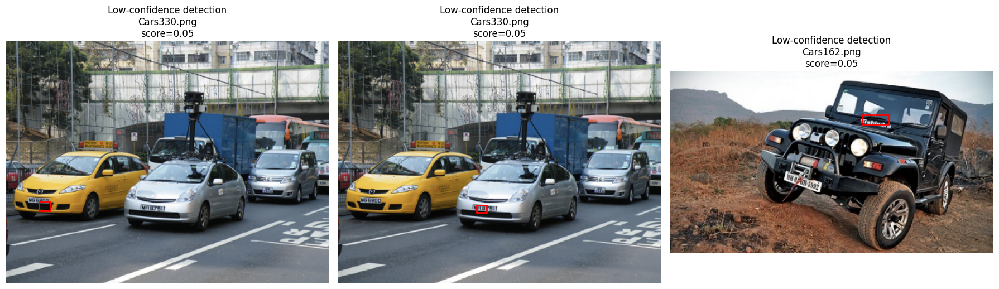

In [ ]:
show_retina_selected_examples(
    retina_selected_low_3,
    IMAGES_TEST_DIR,
    "Low-confidence detection"
)

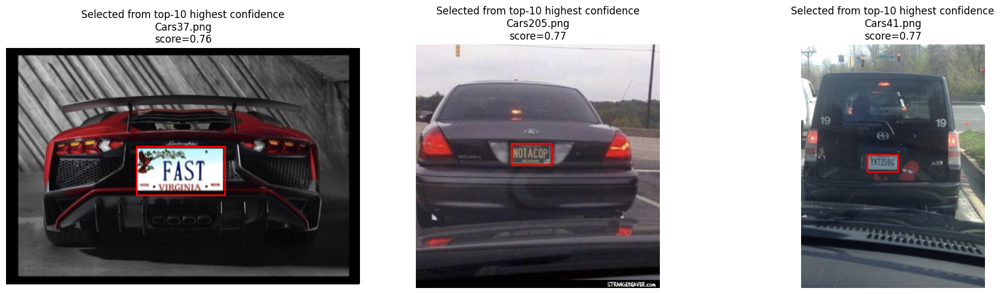

In [ ]:
show_retina_selected_examples(
    retina_selected_from_highest10_3,
    IMAGES_TEST_DIR,
    "Selected from top-10 highest confidence"
)

##Show images with no detection

In [ ]:
retina_no_detection_df = retina_test_conf_df[retina_test_conf_df["confidence"].isna()].copy()
display(retina_no_detection_df)

,image_name,detection_index,confidence,x1,y1,x2,y2


##Confidence summary

In [ ]:
print(
    f"The RetinaNet model produced {retina_confidence_stats['num_predicted_boxes']} predicted boxes on the test set. "
    f"The mean confidence was {retina_confidence_stats['mean_confidence']:.4f}, "
    f"the median confidence was {retina_confidence_stats['median_confidence']:.4f}, "
    f"the minimum confidence was {retina_confidence_stats['min_confidence']:.4f}, "
    f"and the maximum confidence was {retina_confidence_stats['max_confidence']:.4f}."
)

The RetinaNet model produced 1405 predicted boxes on the test set. The mean confidence was 0.1527, the median confidence was 0.0969, the minimum confidence was 0.0500, and the maximum confidence was 0.8599.


The confidence profile is the most revealing part of the RetinaNet analysis. On the 65 test images the
model produced 1405 predicted boxes.. an order of magnitude more than YOLOv8n (which produced 77 boxes on
the same test set) and far more than Faster R-CNN. The mean confidence was only 0.1527 and the median was
0.0969, with a maximum of 0.8599. In other words, RetinaNet fires off a very large number of candidate
detections but keeps the confidence of most of them low.
This is consistent with how RetinaNet works. As a one-stage dense detector with focal loss, it scores every
anchor location and only suppresses the weakest ones, so many low-confidence proposals remain after
non-max suppression. This is also why the best-F1 threshold on validation was 0.45: we have to cut
aggressively to remove noise before precision recovers.
There were zero images with no detection at all. Even in visually harder scenes, at
least one anchor fires above the 0.05 minimum. The low-confidence examples tend to appear on difficult
images where there is small plates, angled views, cluttered backgrounds while the high-confidence ones come from clean
front or rear car shots, which matches the same pattern we observed in YOLO and Faster R-CNN.
The contrast with YOLO is clear. YOLO's 77 detections had a mean confidence of about 0.70, meaning almost
every detection it kept was one it was genuinely confident about. RetinaNet is the opposite: it is very
willing to propose, but often unsure. This difference explains why its threshold is lower and why its
mAP50-95 is weaker even when it catches the right object.

##Load training history to draw graphs

In [ ]:
import pandas as pd

retina_history_df = pd.read_csv(RETINA_HISTORY_PATH)
retina_history_df.columns = [c.strip() for c in retina_history_df.columns]

print("History path:", RETINA_HISTORY_PATH)
print("Rows:", len(retina_history_df))
display(retina_history_df.head())

History path: /content/drive/MyDrive/LicensePlateProject/outputs/train/retinanet_r50_fpn_v2_baseline/history.csv
Rows: 25


,epoch,train_loss,val_map_50_95,val_map_50,val_map_75,val_mar_100,lr
0,1,1.565362,0.000000,0.000000,0.000000,0.000000,0.005
1,2,1.197296,0.000000,0.000000,0.000000,0.000000,0.005
2,3,1.043132,0.008499,0.020418,0.004077,0.508451,0.005
3,4,0.946510,0.026827,0.076784,0.011739,0.497183,0.005
4,5,0.825096,0.052486,0.135742,0.032200,0.532394,0.005


##Training loss vs epoch

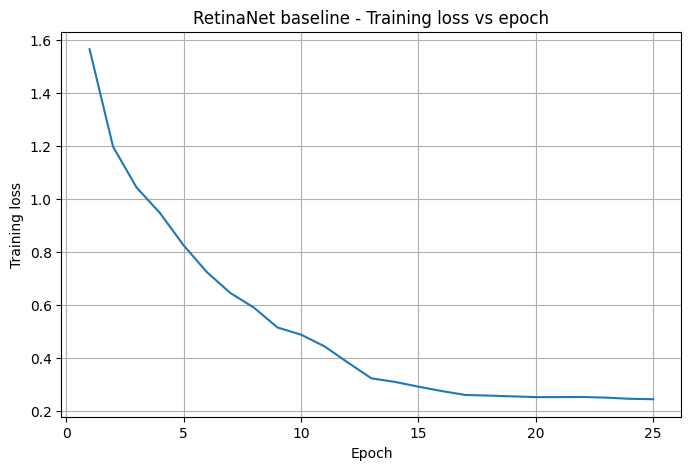

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(retina_history_df["epoch"], retina_history_df["train_loss"])
plt.xlabel("Epoch")
plt.ylabel("Training loss")
plt.title("RetinaNet baseline - Training loss vs epoch")
plt.grid(True)
plt.show()

##Validation mAP50-95 vs epoch

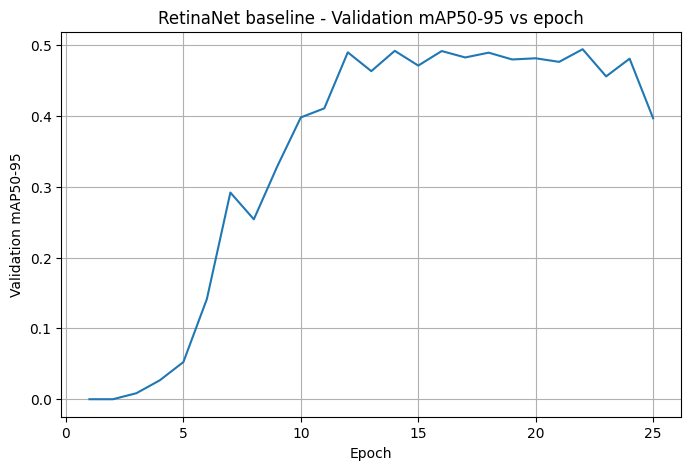

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(retina_history_df["epoch"], retina_history_df["val_map_50_95"])
plt.xlabel("Epoch")
plt.ylabel("Validation mAP50-95")
plt.title("RetinaNet baseline - Validation mAP50-95 vs epoch")
plt.grid(True)
plt.show()

##Validation metrics vs epoch

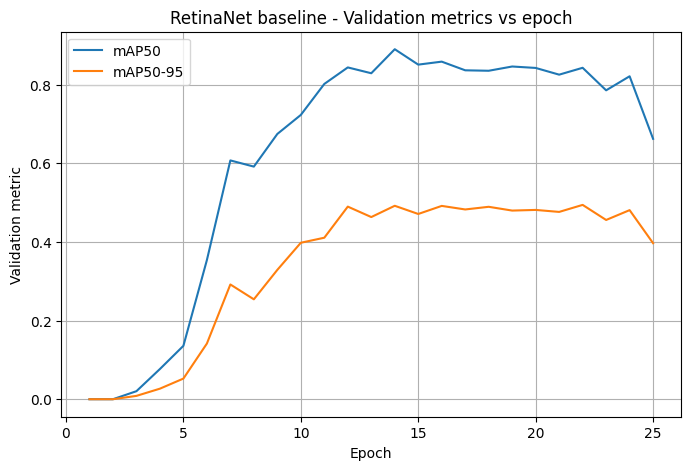

In [ ]:
plt.figure(figsize=(8, 5))
plt.plot(retina_history_df["epoch"], retina_history_df["val_map_50"], label="mAP50")
plt.plot(retina_history_df["epoch"], retina_history_df["val_map_50_95"], label="mAP50-95")
plt.xlabel("Epoch")
plt.ylabel("Validation metric")
plt.title("RetinaNet baseline - Validation metrics vs epoch")
plt.legend()
plt.grid(True)
plt.show()

##Interpretation

In [ ]:
retina_best_epoch_idx = retina_history_df["val_map_50_95"].idxmax()
retina_best_epoch = int(retina_history_df.loc[retina_best_epoch_idx, "epoch"])
retina_best_val_map = float(retina_history_df.loc[retina_best_epoch_idx, "val_map_50_95"])

retina_final_epoch = int(retina_history_df["epoch"].iloc[-1])
retina_final_val_map = float(retina_history_df["val_map_50_95"].iloc[-1])

retina_initial_loss = float(retina_history_df["train_loss"].iloc[0])
retina_final_loss = float(retina_history_df["train_loss"].iloc[-1])

retina_loss_reduction = retina_initial_loss - retina_final_loss
retina_val_drop_after_best = retina_best_val_map - retina_final_val_map

print("Best epoch:", retina_best_epoch)
print("Best validation mAP50-95:", round(retina_best_val_map, 4))
print("Final epoch:", retina_final_epoch)
print("Final validation mAP50-95:", round(retina_final_val_map, 4))
print("Training loss reduction:", round(retina_loss_reduction, 4))
print("Validation drop after best epoch:", round(retina_val_drop_after_best, 4))

if retina_best_val_map < 0.3 and retina_final_loss > 1.0:
    retina_interpretation = "likely underfitting"
    retina_reason = "training loss stayed relatively high and validation mAP50-95 remained low."
elif retina_val_drop_after_best > 0.02:
    retina_interpretation = "likely overfitting"
    retina_reason = "training continued, but validation mAP50-95 dropped noticeably after the best epoch."
else:
    retina_interpretation = "reasonably balanced"
    retina_reason = "training loss decreased and validation mAP50-95 improved without a strong late drop."

print("\nInterpretation:", retina_interpretation)
print("Reason:", retina_reason)

Best epoch: 22
Best validation mAP50-95: 0.494
Final epoch: 25
Final validation mAP50-95: 0.3967
Training loss reduction: 1.3219
Validation drop after best epoch: 0.0973

Interpretation: likely overfitting
Reason: training continued, but validation mAP50-95 dropped noticeably after the best epoch.


The training curves show a different overfitting pattern than Faster R-CNN. The training loss decreased
steadily across all 25 epochs, going down by about 1.32 in total, which means optimization kept working
until the end. The validation mAP50-95 improved slowly over most of training and reached its best value of
0.494 at epoch 22, then dropped sharply to 0.397 by the final epoch, a late drop of about 0.097 in only
three epochs.
Looking at the validation curve more carefully, epoch 22 is not really a meaningful peak. From around
epoch 13 to epoch 22 the validation mAP50-95 stays essentially flat at roughly 0.48, oscillating in a
narrow band. The value of 0.494 at epoch 22 is only marginally above this plateau and is more likely a
lucky bump than a genuine improvement. This matters because the saved best weights come from that
epoch, which means the weights we used in all downstream RetinaNet evaluation were likely already
starting to overfit. The real useful learning for this model finished around epoch 13, and everything
after that was either a flat plateau or gradual overfitting that happened to get noisily selected at
epoch 22 before collapsing in the last three epochs.
This is qualitatively different from Faster R-CNN, which peaked very early (around epoch 2) and then
declined for the rest of training. RetinaNet instead trains productively for the first third of the
schedule and then plateaus, with a late collapse at the very end. YOLO sits between the two: it peaked
late at epoch 23 and declined only mildly, which we called a plateau rather than overfitting.
The combined validation plot tells the same story. mAP50 stays higher throughout because the model can
still roughly locate the plate, but mAP50-95 is noticeably lower and drops more than mAP50 at the end,
showing that the damage from the late overfitting is concentrated in strict localization quality rather
than in the basic ability to find a plate.
The takeaway is that for this dataset and schedule, RetinaNet would have benefited from early stopping
around epoch 13, when the curve first reached its plateau, rather than continuing for 12 more epochs of
flat or declining validation. The model is capable, since around 0.48 validation mAP50-95 is roughly what
it can achieve here, but the last half of training did not add real value, and the saved best checkpoint
at epoch 22 was probably already lightly overfitted. Combined with its weaker headline numbers and its
very large number of low-confidence detections, RetinaNet ends up being the least competitive of the
three architectures on this small 433-image dataset, despite being the heaviest model of the three.

#Final comparisons and conclusions

##Reload

## This is after all sessions ended. Please skip all code till you reach summaries. Combining all the results header contains the summaries

In [ ]:
from ultralytics import YOLO

yolo_baseline_best_path = OUTPUTS_TRAIN_DIR / "yolo_baseline" / "weights" / "best.pt"
yolo_baseline_model = YOLO(str(yolo_baseline_best_path))

def get_yolo_metric_dict(metrics_obj, split_name, model_name):
    precision = float(metrics_obj.box.mp)
    recall = float(metrics_obj.box.mr)
    map50 = float(metrics_obj.box.map50)
    map50_95 = float(metrics_obj.box.map)
    f1_score = 0.0 if (precision + recall) == 0 else 2 * precision * recall / (precision + recall)

    return {
        "model": model_name,
        "split": split_name,
        "score_threshold": None,
        "iou_threshold": None,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
        "map50": map50,
        "map50_95": map50_95,
        "map75": None,
        "mar100": None,
    }

yolo_val_metrics = yolo_baseline_model.val(
    data=str(YAML_PATH),
    split="val",
    project=str(OUTPUTS_DIR),
    name="val_yolo_baseline_clean",
    exist_ok=True
)

yolo_test_metrics = yolo_baseline_model.val(
    data=str(YAML_PATH),
    split="test",
    project=str(OUTPUTS_DIR),
    name="test_yolo_baseline_clean",
    exist_ok=True
)

yolo_baseline_results_df = pd.DataFrame([
    get_yolo_metric_dict(yolo_val_metrics, "validation", "YOLOv8n baseline"),
    get_yolo_metric_dict(yolo_test_metrics, "test", "YOLOv8n baseline"),
])

display(yolo_baseline_results_df)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.40 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 172.5±21.4 MB/s, size: 545.8 KB)
val: Scanning /content/drive/MyDrive/LicensePlateProject/data/yolo_dataset/labels/val.cache... 65 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 65/65 12.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 5/5 1.5s/it 7.7s
                   all         65         71      0.938      0.857      0.901      0.558
Speed: 4.6ms preprocess, 16.9ms inference, 0.0ms loss, 3.7

,model,split,score_threshold,iou_threshold,precision,recall,f1_score,map50,map50_95,map75,mar100
0,YOLOv8n baseline,validation,None,None,0.938284,0.856553,0.895558,0.901178,0.558310,None,None
1,YOLOv8n baseline,test,None,None,0.944560,0.885714,0.914191,0.950503,0.560519,None,None


here the iou_threshold should be 50
and the score_threshold is automatically chosen to be the best to maximize the F1-score.

In [ ]:
FRCNN_RUN_NAME = "fasterrcnn_r50_fpn_v2_baseline"
RETINA_RUN_NAME = "retinanet_r50_fpn_v2_baseline"

FRCNN_METRICS_JSON_PATH = OUTPUTS_VAL_DIR / FRCNN_RUN_NAME / "metrics_summary.json"
RETINA_METRICS_JSON_PATH = OUTPUTS_VAL_DIR / RETINA_RUN_NAME / "metrics_summary.json"

with open(FRCNN_METRICS_JSON_PATH, "r") as f:
    frcnn_summary = json.load(f)

with open(RETINA_METRICS_JSON_PATH, "r") as f:
    retina_summary = json.load(f)

frcnn_val_best_metrics = frcnn_summary["val_metrics"]
frcnn_test_best_metrics = frcnn_summary["test_metrics"]

retina_val_best_metrics = retina_summary["val_metrics"]
retina_test_best_metrics = retina_summary["test_metrics"]

print("FRCNN loaded:", FRCNN_METRICS_JSON_PATH)
print("RetinaNet loaded:", RETINA_METRICS_JSON_PATH)

FRCNN loaded: /content/drive/MyDrive/LicensePlateProject/outputs/val/fasterrcnn_r50_fpn_v2_baseline/metrics_summary.json
RetinaNet loaded: /content/drive/MyDrive/LicensePlateProject/outputs/val/retinanet_r50_fpn_v2_baseline/metrics_summary.json


In [ ]:
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

class LicensePlateFRCNNDataset(Dataset):
    def __init__(self, images_dir, labels_dir):
        self.images_dir = Path(images_dir)
        self.labels_dir = Path(labels_dir)

        self.image_paths = sorted(
            [p for p in self.images_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
        )

        if len(self.image_paths) == 0:
            raise ValueError(f"No images found in {self.images_dir}")

    def __len__(self):
        return len(self.image_paths)

    def _read_yolo_boxes(self, label_path, width, height):
        boxes = []
        labels = []

        if not label_path.exists():
            return (
                torch.zeros((0, 4), dtype=torch.float32),
                torch.zeros((0,), dtype=torch.int64)
            )

        with open(label_path, "r") as f:
            lines = [line.strip() for line in f.readlines() if line.strip()]

        for line in lines:
            parts = line.split()
            if len(parts) != 5:
                continue

            cls_id, x_center, y_center, box_w, box_h = map(float, parts)

            x_center *= width
            y_center *= height
            box_w *= width
            box_h *= height

            x1 = x_center - box_w / 2.0
            y1 = y_center - box_h / 2.0
            x2 = x_center + box_w / 2.0
            y2 = y_center + box_h / 2.0

            x1 = max(0, min(x1, width - 1))
            y1 = max(0, min(y1, height - 1))
            x2 = max(0, min(x2, width - 1))
            y2 = max(0, min(y2, height - 1))

            if x2 > x1 and y2 > y1:
                boxes.append([x1, y1, x2, y2])
                labels.append(1)

        if len(boxes) == 0:
            return (
                torch.zeros((0, 4), dtype=torch.float32),
                torch.zeros((0,), dtype=torch.int64)
            )

        return torch.tensor(boxes, dtype=torch.float32), torch.tensor(labels, dtype=torch.int64)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        label_path = self.labels_dir / f"{image_path.stem}.txt"

        image = Image.open(image_path).convert("RGB")
        width, height = image.size

        boxes, labels = self._read_yolo_boxes(label_path, width, height)

        image_tensor = torchvision.transforms.functional.pil_to_tensor(image).float() / 255.0

        area = (
            (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1])
            if len(boxes) > 0
            else torch.zeros((0,), dtype=torch.float32)
        )

        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {
            "boxes": boxes,
            "labels": labels,
            "image_id": torch.tensor([idx], dtype=torch.int64),
            "area": area,
            "iscrowd": iscrowd
        }

        return image_tensor, target, image_path.name

def collate_fn(batch):
    images, targets, names = zip(*batch)
    return list(images), list(targets), list(names)

In [ ]:
FRCNN_NUM_WORKERS = 2

frcnn_val_dataset = LicensePlateFRCNNDataset(IMAGES_VAL_DIR, LABELS_VAL_DIR)
frcnn_test_dataset = LicensePlateFRCNNDataset(IMAGES_TEST_DIR, LABELS_TEST_DIR)

frcnn_val_loader = DataLoader(
    frcnn_val_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=FRCNN_NUM_WORKERS,
    collate_fn=collate_fn
)

frcnn_test_loader = DataLoader(
    frcnn_test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=FRCNN_NUM_WORKERS,
    collate_fn=collate_fn
)

In [ ]:
FRCNN_NUM_WORKERS = 2

frcnn_val_dataset = LicensePlateFRCNNDataset(IMAGES_VAL_DIR, LABELS_VAL_DIR)
frcnn_test_dataset = LicensePlateFRCNNDataset(IMAGES_TEST_DIR, LABELS_TEST_DIR)

frcnn_val_loader = DataLoader(
    frcnn_val_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=FRCNN_NUM_WORKERS,
    collate_fn=collate_fn
)

frcnn_test_loader = DataLoader(
    frcnn_test_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=FRCNN_NUM_WORKERS,
    collate_fn=collate_fn
)

In [ ]:
with open(FRCNN_METRICS_JSON_PATH, "r") as f:
    frcnn_summary = json.load(f)

frcnn_val_best_metrics = frcnn_summary["val_metrics"]
frcnn_test_best_metrics = frcnn_summary["test_metrics"]

In [ ]:
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

def get_frcnn_model(num_classes=2):
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)

    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    return model

frcnn_best_model = get_frcnn_model(num_classes=2).to(device)
frcnn_best_model.load_state_dict(torch.load(FRCNN_BEST_MODEL_PATH, map_location=device))
frcnn_best_model.eval()

print("Faster R-CNN best model loaded successfully.")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


100%|██████████| 167M/167M [00:01<00:00, 90.6MB/s]


Faster R-CNN best model loaded successfully.


In [ ]:
def compute_iou_xyxy(box1, box2):
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    inter_w = max(0.0, x2 - x1)
    inter_h = max(0.0, y2 - y1)
    inter_area = inter_w * inter_h

    area1 = max(0.0, box1[2] - box1[0]) * max(0.0, box1[3] - box1[1])
    area2 = max(0.0, box2[2] - box2[0]) * max(0.0, box2[3] - box2[1])

    union = area1 + area2 - inter_area
    if union <= 0:
        return 0.0

    return inter_area / union

In [ ]:
@torch.no_grad()
def evaluate_frcnn_precision_recall_f1(model, loader, device, split_name="val", score_threshold=0.70, iou_threshold=0.50):
    model.eval()

    total_tp = 0
    total_fp = 0
    total_fn = 0

    for images, targets, _ in loader:
        images_device = [img.to(device) for img in images]
        outputs = model(images_device)

        for output, target in zip(outputs, targets):
            pred_boxes = output["boxes"].detach().cpu()
            pred_scores = output["scores"].detach().cpu()
            pred_labels = output["labels"].detach().cpu()

            gt_boxes = target["boxes"].detach().cpu()
            gt_labels = target["labels"].detach().cpu()

            keep = pred_scores >= score_threshold
            pred_boxes = pred_boxes[keep]
            pred_labels = pred_labels[keep]

            matched_gt = set()

            for pred_box, pred_label in zip(pred_boxes, pred_labels):
                best_iou = 0.0
                best_gt_idx = -1

                for gt_idx, (gt_box, gt_label) in enumerate(zip(gt_boxes, gt_labels)):
                    if gt_idx in matched_gt:
                        continue
                    if int(pred_label.item()) != int(gt_label.item()):
                        continue

                    iou = compute_iou_xyxy(pred_box.tolist(), gt_box.tolist())
                    if iou > best_iou:
                        best_iou = iou
                        best_gt_idx = gt_idx

                if best_iou >= iou_threshold and best_gt_idx != -1:
                    total_tp += 1
                    matched_gt.add(best_gt_idx)
                else:
                    total_fp += 1

            total_fn += len(gt_boxes) - len(matched_gt)

    precision = total_tp / (total_tp + total_fp) if (total_tp + total_fp) > 0 else 0.0
    recall = total_tp / (total_tp + total_fn) if (total_tp + total_fn) > 0 else 0.0
    f1_score = (2 * precision * recall / (precision + recall)) if (precision + recall) > 0 else 0.0

    return {
        "split": split_name,
        "score_threshold": score_threshold,
        "iou_threshold": iou_threshold,
        "tp": total_tp,
        "fp": total_fp,
        "fn": total_fn,
        "precision": precision,
        "recall": recall,
        "f1_score": f1_score,
    }

In [ ]:
frcnn_best_threshold = 0.70

frcnn_val_prf = evaluate_frcnn_precision_recall_f1(
    frcnn_best_model,
    frcnn_val_loader,
    device,
    split_name="validation",
    score_threshold=frcnn_best_threshold,
    iou_threshold=0.50
)

frcnn_test_prf = evaluate_frcnn_precision_recall_f1(
    frcnn_best_model,
    frcnn_test_loader,
    device,
    split_name="test",
    score_threshold=frcnn_best_threshold,
    iou_threshold=0.50
)

print(frcnn_val_prf)
print(frcnn_test_prf)

{'split': 'validation', 'score_threshold': 0.7, 'iou_threshold': 0.5, 'tp': 66, 'fp': 7, 'fn': 5, 'precision': 0.9041095890410958, 'recall': 0.9295774647887324, 'f1_score': 0.9166666666666666}
{'split': 'test', 'score_threshold': 0.7, 'iou_threshold': 0.5, 'tp': 66, 'fp': 10, 'fn': 4, 'precision': 0.868421052631579, 'recall': 0.9428571428571428, 'f1_score': 0.904109589041096}


In [ ]:
frcnn_headline_table = pd.DataFrame([
    {
        "model": "Faster R-CNN baseline",
        "split": "validation",
        "score_threshold": 0.70,
        "iou_threshold": 0.50,
        "precision": frcnn_val_prf["precision"],
        "recall": frcnn_val_prf["recall"],
        "f1_score": frcnn_val_prf["f1_score"],
        "map50": frcnn_val_best_metrics.get("map_50", None),
        "map50_95": frcnn_val_best_metrics.get("map", None),
        "map75": frcnn_val_best_metrics.get("map_75", None),
        "mar100": frcnn_val_best_metrics.get("mar_100", None),
    },
    {
        "model": "Faster R-CNN baseline",
        "split": "test",
        "score_threshold": 0.70,
        "iou_threshold": 0.50,
        "precision": frcnn_test_prf["precision"],
        "recall": frcnn_test_prf["recall"],
        "f1_score": frcnn_test_prf["f1_score"],
        "map50": frcnn_test_best_metrics.get("map_50", None),
        "map50_95": frcnn_test_best_metrics.get("map", None),
        "map75": frcnn_test_best_metrics.get("map_75", None),
        "mar100": frcnn_test_best_metrics.get("mar_100", None),
    }
])

display(frcnn_headline_table)

,model,split,score_threshold,iou_threshold,precision,recall,f1_score,map50,map50_95,map75,mar100
0,Faster R-CNN baseline,validation,0.7,0.5,0.904110,0.929577,0.916667,0.959688,0.589980,0.590278,0.677465
1,Faster R-CNN baseline,test,0.7,0.5,0.868421,0.942857,0.904110,0.961132,0.545156,0.549030,0.627143


In [ ]:
retina_headline_table = pd.DataFrame([
    {
        "model": "RetinaNet baseline",
        "split": "validation",
        "score_threshold": 0.45,
        "iou_threshold": 0.50,
        "precision": 0.901639,
        "recall": 0.774648,
        "f1_score": 0.833333,
        "map50": retina_val_best_metrics.get("map_50", None),
        "map50_95": retina_val_best_metrics.get("map", None),
        "map75": retina_val_best_metrics.get("map_75", None),
        "mar100": retina_val_best_metrics.get("mar_100", None),
    },
    {
        "model": "RetinaNet baseline",
        "split": "test",
        "score_threshold": 0.45,
        "iou_threshold": 0.50,
        "precision": 0.842857,
        "recall": 0.842857,
        "f1_score": 0.842857,
        "map50": retina_test_best_metrics.get("map_50", None),
        "map50_95": retina_test_best_metrics.get("map", None),
        "map75": retina_test_best_metrics.get("map_75", None),
        "mar100": retina_test_best_metrics.get("mar_100", None),
    }
])

display(retina_headline_table)

,model,split,score_threshold,iou_threshold,precision,recall,f1_score,map50,map50_95,map75,mar100
0,RetinaNet baseline,validation,0.45,0.5,0.901639,0.774648,0.833333,0.842575,0.494042,0.541215,0.63662
1,RetinaNet baseline,test,0.45,0.5,0.842857,0.842857,0.842857,0.858928,0.487783,0.488030,0.62000


#Combining all the results

In [ ]:
yolo_table = yolo_baseline_results_df.copy()
frcnn_table = frcnn_headline_table.copy()
retina_table = retina_headline_table.copy()

for df in [yolo_table, frcnn_table, retina_table]:
    for col in ["score_threshold", "iou_threshold", "precision", "recall", "f1_score", "map50", "map50_95", "map75", "mar100"]:
        if col not in df.columns:
            df[col] = None

final_comparison_table = pd.concat([
    yolo_table[["model", "split", "score_threshold", "iou_threshold", "precision", "recall", "f1_score", "map50", "map50_95", "map75", "mar100"]],
    frcnn_table[["model", "split", "score_threshold", "iou_threshold", "precision", "recall", "f1_score", "map50", "map50_95", "map75", "mar100"]],
    retina_table[["model", "split", "score_threshold", "iou_threshold", "precision", "recall", "f1_score", "map50", "map50_95", "map75", "mar100"]],
], ignore_index=True)

display(final_comparison_table)

/tmp/ipykernel_532/4294702049.py:10: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final_comparison_table = pd.concat([


,model,split,score_threshold,iou_threshold,precision,recall,f1_score,map50,map50_95,map75,mar100
0,YOLOv8n baseline,validation,NaN,NaN,0.938284,0.856553,0.895558,0.901178,0.558310,NaN,NaN
1,YOLOv8n baseline,test,NaN,NaN,0.944560,0.885714,0.914191,0.950503,0.560519,NaN,NaN
2,Faster R-CNN baseline,validation,0.70,0.5,0.904110,0.929577,0.916667,0.959688,0.589980,0.590278,0.677465
3,Faster R-CNN baseline,test,0.70,0.5,0.868421,0.942857,0.904110,0.961132,0.545156,0.549030,0.627143
4,RetinaNet baseline,validation,0.45,0.5,0.901639,0.774648,0.833333,0.842575,0.494042,0.541215,0.636620
5,RetinaNet baseline,test,0.45,0.5,0.842857,0.842857,0.842857,0.858928,0.487783,0.488030,0.620000


##Confidence summaries

* **YOLOv8n**. The lightest model of the three, and the most decisive in how it detects. It kept only 77
detections across the 65 test images, with a mean confidence around 0.70, meaning almost every box it
produced was one it was genuinely sure about. This makes YOLO the easiest to deploy and interpret.

* **Faster R-CNN.** Stronger on the easier mAP50 metric, which shows it is very good at roughly locating the
plate, but its strict-localization score was weaker and the training curves showed clear early overfitting.
It produced about 2.5 times more boxes than YOLO with a much lower mean confidence, so it is more
confident that a plate is somewhere but less confident about which specific region is the right one.

* **RetinaNet.** The heaviest model, but the weakest on every headline metric. It produced about 1400
detections on the test set with a mean confidence around 0.15, which is why its best threshold had to be
set much lower than the other two. The training curves also showed a long plateau followed by a late
collapse, which suggests the reported results are closer to the upper end of what this model can do on a
dataset this small.

#Statistical Comparison: YOLOv8n vs Faster R-

So far we compared the three models using point estimates of precision, recall, F1, and mAP.
A point estimate alone cannot tell us whether the gap between two models is real or just noise
from a small test set (we only have 62 test images). To pick the best model with more confidence,
we will do a bootstrap analysis between the two strongest candidates: **YOLOv8n** and **Faster R-CNN**
(RetinaNet is clearly weaker on every metric, so we exclude it from the final comparison).

**What we will do:**
1. Reload both best models.
2. Run inference **once** on the validation set (to pick a fair best-F1 threshold for YOLO, matching what
   we did for Faster R-CNN) and once on the test set for both models.
3. Cache all predictions to disk (so this block is cheap to re-run).
4. Bootstrap-resample the 62 test images 500 times. For each resample, recompute mAP50-95 and F1 for both models.
5. Report 95% confidence intervals for each metric and each model.
6. For each metric, compute a **paired** bootstrap distribution of the difference (Faster R-CNN − YOLO)
   and a two-sided p-value for the null hypothesis "no difference".
7. Pick the final best model.


**Why did we make such a decision:** both models are evaluated on the exact same resampled images in every bootstrap
iteration. This removes image-difficulty noise from the comparison and is more statistically powerful than
comparing two independent CIs.

In [4]:
!pip -q install ultralytics torchmetrics pycocotools

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 24.9 MB/s eta 0:00:00


## 1. Reload everything we need (can skip)

In [5]:

# Reload imports, paths, device, and helper functions so this appendix works
# in a fresh session without rerunning earlier cells.

import json
import random
from pathlib import Path

import numpy as np
import pandas as pd
from PIL import Image

import torch
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from torchmetrics.detection.mean_ap import MeanAveragePrecision
from ultralytics import YOLO

import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# Paths (same as the rest of the project)
PROJECT_ROOT = Path("/content/drive/MyDrive/LicensePlateProject")
DATA_DIR = PROJECT_ROOT / "data"
YOLO_DIR = DATA_DIR / "yolo_dataset"

IMAGES_VAL_DIR = YOLO_DIR / "images" / "val"
IMAGES_TEST_DIR = YOLO_DIR / "images" / "test"
LABELS_VAL_DIR = YOLO_DIR / "labels" / "val"
LABELS_TEST_DIR = YOLO_DIR / "labels" / "test"

OUTPUTS_DIR = PROJECT_ROOT / "outputs"
OUTPUTS_TRAIN_DIR = OUTPUTS_DIR / "train"
OUTPUTS_MODELS_DIR = OUTPUTS_DIR / "models"

YAML_PATH = YOLO_DIR / "license_plate.yaml"

# Bootstrap output folder
BOOTSTRAP_DIR = OUTPUTS_DIR / "bootstrap_comparison"
BOOTSTRAP_DIR.mkdir(parents=True, exist_ok=True)

# Prediction cache folder
BOOTSTRAP_CACHE_DIR = BOOTSTRAP_DIR / "cached_predictions"
BOOTSTRAP_CACHE_DIR.mkdir(parents=True, exist_ok=True)

# Model paths
YOLO_BEST_PATH = OUTPUTS_TRAIN_DIR / "yolo_baseline" / "weights" / "best.pt"
FRCNN_RUN_NAME = "fasterrcnn_r50_fpn_v2_baseline"
FRCNN_BEST_MODEL_PATH = OUTPUTS_MODELS_DIR / f"{FRCNN_RUN_NAME}_best.pth"

print("YOLO best weights exist:", YOLO_BEST_PATH.exists())
print("FRCNN best weights exist:", FRCNN_BEST_MODEL_PATH.exists())


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Device: cuda
YOLO best weights exist: True
FRCNN best weights exist: True


In [6]:
# Rebuild the Faster R-CNN architecture and load trained weights

def get_frcnn_model(num_classes=2):
    weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
    model = fasterrcnn_resnet50_fpn_v2(weights=weights)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

frcnn_best_model = get_frcnn_model(num_classes=2).to(device)
frcnn_best_model.load_state_dict(torch.load(FRCNN_BEST_MODEL_PATH, map_location=device))
frcnn_best_model.eval()

# Reload YOLO best checkpoint
yolo_best_model = YOLO(str(YOLO_BEST_PATH))

print("Both models reloaded.")

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_v2_coco-dd69338a.pth


100%|██████████| 167M/167M [00:00<00:00, 196MB/s]


Both models reloaded.


In [7]:
# Rebuild the dataset class (same one used earlier in the project) and the loaders.
# We only need val + test here.

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

class LicensePlateFRCNNDataset(Dataset):
    def __init__(self, images_dir, labels_dir):
        self.images_dir = Path(images_dir)
        self.labels_dir = Path(labels_dir)
        self.image_paths = sorted(
            [p for p in self.images_dir.iterdir() if p.suffix.lower() in IMG_EXTS]
        )
        if len(self.image_paths) == 0:
            raise ValueError(f"No images found in {self.images_dir}")

    def __len__(self):
        return len(self.image_paths)

    def _read_yolo_boxes(self, label_path, width, height):
        boxes, labels = [], []
        if not label_path.exists():
            return (torch.zeros((0, 4), dtype=torch.float32),
                    torch.zeros((0,), dtype=torch.int64))
        with open(label_path, "r") as f:
            lines = [line.strip() for line in f.readlines() if line.strip()]
        for line in lines:
            parts = line.split()
            if len(parts) != 5:
                continue
            _, xc, yc, bw, bh = map(float, parts)
            xc *= width; yc *= height; bw *= width; bh *= height
            x1 = max(0, min(xc - bw / 2.0, width - 1))
            y1 = max(0, min(yc - bh / 2.0, height - 1))
            x2 = max(0, min(xc + bw / 2.0, width - 1))
            y2 = max(0, min(yc + bh / 2.0, height - 1))
            if x2 > x1 and y2 > y1:
                boxes.append([x1, y1, x2, y2])
                labels.append(1)
        if len(boxes) == 0:
            return (torch.zeros((0, 4), dtype=torch.float32),
                    torch.zeros((0,), dtype=torch.int64))
        return (torch.tensor(boxes, dtype=torch.float32),
                torch.tensor(labels, dtype=torch.int64))

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label_path = self.labels_dir / (img_path.stem + ".txt")
        img_pil = Image.open(img_path).convert("RGB")
        w, h = img_pil.size
        img_tensor = torchvision.transforms.functional.to_tensor(img_pil)
        boxes, labels = self._read_yolo_boxes(label_path, w, h)
        target = {"boxes": boxes, "labels": labels}
        return img_tensor, target, img_path.name

def frcnn_collate_fn(batch):
    images, targets, names = zip(*batch)
    return list(images), list(targets), list(names)

val_dataset = LicensePlateFRCNNDataset(IMAGES_VAL_DIR, LABELS_VAL_DIR)
test_dataset = LicensePlateFRCNNDataset(IMAGES_TEST_DIR, LABELS_TEST_DIR)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False,
                        num_workers=2, collate_fn=frcnn_collate_fn)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False,
                         num_workers=2, collate_fn=frcnn_collate_fn)

print(f"Val images: {len(val_dataset)} | Test images: {len(test_dataset)}")


Val images: 65 | Test images: 65



## 2. Run inference once per model per split (code starts here)

We cache predictions so bootstrap iterations just index into Python lists, no model forward passes.



In [8]:

# Helper: run inference with each model, return a list of per-image records:
# { "name", "width", "height", "gt_boxes" (N,4), "pred_boxes" (M,4), "pred_scores" (M,) }
# All boxes in absolute xyxy pixel coordinates.

@torch.no_grad()
def collect_frcnn_predictions(model, loader, device):
    model.eval()
    records = []
    for images, targets, names in loader:
        images_device = [img.to(device) for img in images]
        outputs = model(images_device)
        for img, out, tgt, name in zip(images, outputs, targets, names):
            _, h, w = img.shape
            pred_boxes = out["boxes"].detach().cpu().numpy()
            pred_scores = out["scores"].detach().cpu().numpy()
            pred_labels = out["labels"].detach().cpu().numpy()
            # Keep only class 1 (license plate)
            mask = pred_labels == 1
            pred_boxes = pred_boxes[mask]
            pred_scores = pred_scores[mask]
            gt_boxes = tgt["boxes"].detach().cpu().numpy()
            records.append({
                "name": name,
                "width": int(w), "height": int(h),
                "gt_boxes": gt_boxes.astype(np.float32),
                "pred_boxes": pred_boxes.astype(np.float32),
                "pred_scores": pred_scores.astype(np.float32),
            })
    return records


def collect_yolo_predictions(yolo_model, images_dir, labels_dir, conf=0.001, iou=0.7):
    """Run YOLO inference at a very low conf threshold so we keep all detections;
    we will apply our own threshold later when computing F1."""
    records = []
    image_paths = sorted([p for p in Path(images_dir).iterdir() if p.suffix.lower() in IMG_EXTS])
    for img_path in image_paths:
        label_path = Path(labels_dir) / (img_path.stem + ".txt")
        img_pil = Image.open(img_path).convert("RGB")
        w, h = img_pil.size
        # Inference
        res = yolo_model.predict(source=str(img_path), conf=conf, iou=iou,
                                 verbose=False, save=False)[0]
        if res.boxes is not None and len(res.boxes) > 0:
            pred_boxes = res.boxes.xyxy.detach().cpu().numpy().astype(np.float32)
            pred_scores = res.boxes.conf.detach().cpu().numpy().astype(np.float32)
        else:
            pred_boxes = np.zeros((0, 4), dtype=np.float32)
            pred_scores = np.zeros((0,), dtype=np.float32)
        # Ground truth from YOLO label file
        gt_boxes = []
        if label_path.exists():
            with open(label_path, "r") as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) != 5:
                        continue
                    _, xc, yc, bw, bh = map(float, parts)
                    xc *= w; yc *= h; bw *= w; bh *= h
                    x1 = max(0, min(xc - bw / 2.0, w - 1))
                    y1 = max(0, min(yc - bh / 2.0, h - 1))
                    x2 = max(0, min(xc + bw / 2.0, w - 1))
                    y2 = max(0, min(yc + bh / 2.0, h - 1))
                    if x2 > x1 and y2 > y1:
                        gt_boxes.append([x1, y1, x2, y2])
        gt_boxes = np.array(gt_boxes, dtype=np.float32) if gt_boxes else np.zeros((0, 4), dtype=np.float32)
        records.append({
            "name": img_path.name,
            "width": int(w), "height": int(h),
            "gt_boxes": gt_boxes,
            "pred_boxes": pred_boxes,
            "pred_scores": pred_scores,
        })
    return records


def save_records(records, path):
    # Save with numpy savez per record, indexed by name
    payload = {}
    for i, r in enumerate(records):
        payload[f"{i}_name"] = np.array([r["name"]])
        payload[f"{i}_wh"] = np.array([r["width"], r["height"]])
        payload[f"{i}_gt"] = r["gt_boxes"]
        payload[f"{i}_pb"] = r["pred_boxes"]
        payload[f"{i}_ps"] = r["pred_scores"]
    payload["__n__"] = np.array([len(records)])
    np.savez(path, **payload)


def load_records(path):
    data = np.load(path, allow_pickle=False)
    n = int(data["__n__"][0])
    records = []
    for i in range(n):
        records.append({
            "name": str(data[f"{i}_name"][0]),
            "width": int(data[f"{i}_wh"][0]),
            "height": int(data[f"{i}_wh"][1]),
            "gt_boxes": data[f"{i}_gt"],
            "pred_boxes": data[f"{i}_pb"],
            "pred_scores": data[f"{i}_ps"],
        })
    return records

print("Helper functions defined.")

Helper functions defined.


In [9]:

# Run inference (or load from cache) for all 4 needed prediction sets.
# Cache key: <model>_<split>.npz

CACHE_FILES = {
    "yolo_val":   BOOTSTRAP_CACHE_DIR / "yolo_val.npz",
    "yolo_test":  BOOTSTRAP_CACHE_DIR / "yolo_test.npz",
    "frcnn_val":  BOOTSTRAP_CACHE_DIR / "frcnn_val.npz",
    "frcnn_test": BOOTSTRAP_CACHE_DIR / "frcnn_test.npz",
}

def get_or_run(key, runner):
    path = CACHE_FILES[key]
    if path.exists():
        print(f"[cached] {key}")
        return load_records(path)
    print(f"[running inference] {key} ...")
    recs = runner()
    save_records(recs, path)
    print(f"  saved to {path.name}")
    return recs

yolo_val_records   = get_or_run("yolo_val",
                                lambda: collect_yolo_predictions(yolo_best_model, IMAGES_VAL_DIR, LABELS_VAL_DIR))
yolo_test_records  = get_or_run("yolo_test",
                                lambda: collect_yolo_predictions(yolo_best_model, IMAGES_TEST_DIR, LABELS_TEST_DIR))
frcnn_val_records  = get_or_run("frcnn_val",
                                lambda: collect_frcnn_predictions(frcnn_best_model, val_loader, device))
frcnn_test_records = get_or_run("frcnn_test",
                                lambda: collect_frcnn_predictions(frcnn_best_model, test_loader, device))

print("\nAll predictions ready.")
print(f"YOLO test records: {len(yolo_test_records)} | FRCNN test records: {len(frcnn_test_records)}")


[running inference] yolo_val ...
  saved to yolo_val.npz
[running inference] yolo_test ...
  saved to yolo_test.npz
[running inference] frcnn_val ...
  saved to frcnn_val.npz
[running inference] frcnn_test ...
  saved to frcnn_test.npz

All predictions ready.
YOLO test records: 65 | FRCNN test records: 65


## 3. Pick a fair best-F1 threshold for YOLO on validation

This matches the procedure we used for Faster R-CNN (threshold 0.70) and RetinaNet (threshold 0.45).
It makes the F1 comparison fully equal.

In [10]:

# IoU and PRF1 computation on cached records

def iou_xyxy(box1, box2):
    x1 = max(box1[0], box2[0]); y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2]); y2 = min(box1[3], box2[3])
    iw = max(0.0, x2 - x1); ih = max(0.0, y2 - y1)
    inter = iw * ih
    a1 = max(0.0, box1[2]-box1[0]) * max(0.0, box1[3]-box1[1])
    a2 = max(0.0, box2[2]-box2[0]) * max(0.0, box2[3]-box2[1])
    union = a1 + a2 - inter
    return inter / union if union > 0 else 0.0

def prf1_for_record(rec, score_threshold, iou_threshold=0.5):
    """Return (tp, fp, fn) for a single image at a given score threshold."""
    keep = rec["pred_scores"] >= score_threshold
    pred_boxes = rec["pred_boxes"][keep]
    # Sort preds by score descending so greedy matching takes highest-confidence first
    scores_kept = rec["pred_scores"][keep]
    order = np.argsort(-scores_kept)
    pred_boxes = pred_boxes[order]
    gt_boxes = rec["gt_boxes"]
    matched = set()
    tp = 0; fp = 0
    for pb in pred_boxes:
        best_iou = 0.0; best_idx = -1
        for gi, gb in enumerate(gt_boxes):
            if gi in matched:
                continue
            i = iou_xyxy(pb.tolist(), gb.tolist())
            if i > best_iou:
                best_iou = i; best_idx = gi
        if best_iou >= iou_threshold and best_idx != -1:
            tp += 1; matched.add(best_idx)
        else:
            fp += 1
    fn = len(gt_boxes) - len(matched)
    return tp, fp, fn

def prf1_over_records(records, score_threshold, iou_threshold=0.5):
    TP = FP = FN = 0
    for r in records:
        tp, fp, fn = prf1_for_record(r, score_threshold, iou_threshold)
        TP += tp; FP += fp; FN += fn
    P = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    R = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    F1 = (2*P*R / (P + R)) if (P + R) > 0 else 0.0
    return {"precision": P, "recall": R, "f1_score": F1, "tp": TP, "fp": FP, "fn": FN}

# Sweep thresholds on validation for YOLO
candidate_thresholds = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40,
                        0.45, 0.50, 0.55, 0.60, 0.65, 0.70, 0.75, 0.80]

yolo_sweep = []
for t in candidate_thresholds:
    m = prf1_over_records(yolo_val_records, t, iou_threshold=0.5)
    yolo_sweep.append({"score_threshold": t, **m})

yolo_sweep_df = pd.DataFrame(yolo_sweep).sort_values("f1_score", ascending=False).reset_index(drop=True)
yolo_best_threshold = float(yolo_sweep_df.loc[0, "score_threshold"])

print("Top 5 YOLO thresholds by validation F1:")
display(yolo_sweep_df.head())
print(f"\nChosen YOLO threshold (maximizes validation F1): {yolo_best_threshold}")

# For reference, also compute FRCNN val PRF at its fixed threshold 0.70
frcnn_best_threshold = 0.70
print("\nFRCNN val PRF1 at threshold 0.70 (should match your earlier numbers):")
print(prf1_over_records(frcnn_val_records, frcnn_best_threshold, iou_threshold=0.5))
print("YOLO val PRF1 at chosen threshold:")
print(prf1_over_records(yolo_val_records, yolo_best_threshold, iou_threshold=0.5))

Top 5 YOLO thresholds by validation F1:


,score_threshold,precision,recall,f1_score,tp,fp,fn
0,0.50,0.951613,0.830986,0.887218,59,3,12
1,0.40,0.910448,0.859155,0.884058,61,6,10
2,0.60,0.966102,0.802817,0.876923,57,2,14
3,0.55,0.950000,0.802817,0.870229,57,3,14
4,0.25,0.851351,0.887324,0.868966,63,11,8



Chosen YOLO threshold (maximizes validation F1): 0.5

FRCNN val PRF1 at threshold 0.70 (should match your earlier numbers):
{'precision': 0.9041095890410958, 'recall': 0.9295774647887324, 'f1_score': 0.9166666666666666, 'tp': 66, 'fp': 7, 'fn': 5}
YOLO val PRF1 at chosen threshold:
{'precision': 0.9516129032258065, 'recall': 0.8309859154929577, 'f1_score': 0.887218045112782, 'tp': 59, 'fp': 3, 'fn': 12}



## 4. Fast per-bootstrap mAP50-95 using torchmetrics

We compute mAP by building a `MeanAveragePrecision` instance on just the sampled subset of records and calling `compute()`.
We do this in bootstrap loops so we call it 500 times per model, which is the main cost of this step.




In [11]:


def records_to_torchmetrics(records, indices):
    """Build (preds, targets) lists for torchmetrics MeanAveragePrecision from sampled indices."""
    preds, targets = [], []
    for i in indices:
        r = records[i]
        preds.append({
            "boxes":  torch.tensor(r["pred_boxes"], dtype=torch.float32),
            "scores": torch.tensor(r["pred_scores"], dtype=torch.float32),
            "labels": torch.ones(len(r["pred_boxes"]), dtype=torch.int64),
        })
        targets.append({
            "boxes":  torch.tensor(r["gt_boxes"], dtype=torch.float32),
            "labels": torch.ones(len(r["gt_boxes"]), dtype=torch.int64),
        })
    return preds, targets

def compute_map_on_indices(records, indices):
    preds, targets = records_to_torchmetrics(records, indices)
    metric = MeanAveragePrecision(box_format="xyxy", iou_type="bbox")
    metric.update(preds, targets)
    res = metric.compute()
    return float(res["map"].item())  # mAP50-95

def compute_f1_on_indices(records, indices, score_threshold, iou_threshold=0.5):
    TP = FP = FN = 0
    for i in indices:
        tp, fp, fn = prf1_for_record(records[i], score_threshold, iou_threshold)
        TP += tp; FP += fp; FN += fn
    P = TP / (TP + FP) if (TP + FP) > 0 else 0.0
    R = TP / (TP + FN) if (TP + FN) > 0 else 0.0
    return (2*P*R / (P + R)) if (P + R) > 0 else 0.0

print("Metric functions ready.")



Metric functions ready.


## 5. Paired bootstrap (500 resamples of the 65 test images)

In [13]:

N_BOOTSTRAP = 500
n_test = len(yolo_test_records)
assert n_test == len(frcnn_test_records), "YOLO and FRCNN test record counts differ"

rng = np.random.default_rng(SEED)

yolo_map_samples  = np.zeros(N_BOOTSTRAP)
frcnn_map_samples = np.zeros(N_BOOTSTRAP)
yolo_f1_samples   = np.zeros(N_BOOTSTRAP)
frcnn_f1_samples  = np.zeros(N_BOOTSTRAP)

from tqdm import tqdm
for b in tqdm(range(N_BOOTSTRAP), desc="Bootstrap"):
    idx = rng.integers(0, n_test, size=n_test)  # sample with replacement

    yolo_map_samples[b]  = compute_map_on_indices(yolo_test_records,  idx)
    frcnn_map_samples[b] = compute_map_on_indices(frcnn_test_records, idx)

    yolo_f1_samples[b]  = compute_f1_on_indices(yolo_test_records,  idx, yolo_best_threshold)
    frcnn_f1_samples[b] = compute_f1_on_indices(frcnn_test_records, idx, frcnn_best_threshold)

print("Bootstrap done.")

Bootstrap: 100%|██████████| 500/500 [04:14<00:00,  1.96it/s]

Bootstrap done.


## 6. Confidence intervals and paired p-values

In [14]:

def summarize(samples):
    return {
        "mean":   float(np.mean(samples)),
        "median": float(np.median(samples)),
        "ci_low":  float(np.percentile(samples, 2.5)),
        "ci_high": float(np.percentile(samples, 97.5)),
        "std":    float(np.std(samples, ddof=1)),
    }

# Paired differences (FRCNN - YOLO)
map_diff = frcnn_map_samples - yolo_map_samples
f1_diff  = frcnn_f1_samples  - yolo_f1_samples

def two_sided_p_value(diff_samples):
    """Two-sided bootstrap p-value for H0: mean(diff) == 0.
    p = 2 * min( P(diff <= 0), P(diff >= 0) ), standard bootstrap approach."""
    n = len(diff_samples)
    p_le = (np.sum(diff_samples <= 0) + 1) / (n + 1)   # +1 smoothing to avoid p=0
    p_ge = (np.sum(diff_samples >= 0) + 1) / (n + 1)
    return float(min(1.0, 2.0 * min(p_le, p_ge)))

# Point estimates on the full test set (no resampling) for the table
point_yolo_map  = compute_map_on_indices(yolo_test_records,  np.arange(n_test))
point_frcnn_map = compute_map_on_indices(frcnn_test_records, np.arange(n_test))
point_yolo_f1   = compute_f1_on_indices(yolo_test_records,  np.arange(n_test), yolo_best_threshold)
point_frcnn_f1  = compute_f1_on_indices(frcnn_test_records, np.arange(n_test), frcnn_best_threshold)

ci_table = pd.DataFrame([
    {"model": "YOLOv8n",       "metric": "mAP50-95", "point_estimate": point_yolo_map,
     **{k: summarize(yolo_map_samples)[k]  for k in ["ci_low", "ci_high", "std"]}},
    {"model": "Faster R-CNN",  "metric": "mAP50-95", "point_estimate": point_frcnn_map,
     **{k: summarize(frcnn_map_samples)[k] for k in ["ci_low", "ci_high", "std"]}},
    {"model": "YOLOv8n",       "metric": "F1",       "point_estimate": point_yolo_f1,
     **{k: summarize(yolo_f1_samples)[k]   for k in ["ci_low", "ci_high", "std"]}},
    {"model": "Faster R-CNN",  "metric": "F1",       "point_estimate": point_frcnn_f1,
     **{k: summarize(frcnn_f1_samples)[k]  for k in ["ci_low", "ci_high", "std"]}},
])
ci_table = ci_table[["model", "metric", "point_estimate", "ci_low", "ci_high", "std"]]
print("=== 95% Bootstrap Confidence Intervals (test set, 500 resamples) ===")
display(ci_table.round(4))

diff_table = pd.DataFrame([
    {"metric": "mAP50-95",
     "mean_diff_frcnn_minus_yolo": float(np.mean(map_diff)),
     "ci_low":  float(np.percentile(map_diff, 2.5)),
     "ci_high": float(np.percentile(map_diff, 97.5)),
     "p_value_two_sided": two_sided_p_value(map_diff)},
    {"metric": "F1",
     "mean_diff_frcnn_minus_yolo": float(np.mean(f1_diff)),
     "ci_low":  float(np.percentile(f1_diff, 2.5)),
     "ci_high": float(np.percentile(f1_diff, 97.5)),
     "p_value_two_sided": two_sided_p_value(f1_diff)},
])
print("\n=== Paired bootstrap differences (Faster R-CNN minus YOLOv8n) ===")
display(diff_table.round(4))

# Save
ci_table.to_csv(BOOTSTRAP_DIR / "ci_table.csv", index=False)
diff_table.to_csv(BOOTSTRAP_DIR / "diff_table.csv", index=False)
np.savez(BOOTSTRAP_DIR / "bootstrap_samples.npz",
         yolo_map=yolo_map_samples, frcnn_map=frcnn_map_samples,
         yolo_f1=yolo_f1_samples,   frcnn_f1=frcnn_f1_samples)
print("\nSaved CI/diff tables and raw bootstrap samples to:", BOOTSTRAP_DIR)


=== 95% Bootstrap Confidence Intervals (test set, 500 resamples) ===


,model,metric,point_estimate,ci_low,ci_high,std
0,YOLOv8n,mAP50-95,0.5532,0.4880,0.6275,0.0352
1,Faster R-CNN,mAP50-95,0.5452,0.4877,0.6215,0.0340
2,YOLOv8n,F1,0.9254,0.8769,0.9702,0.0248
3,Faster R-CNN,F1,0.9041,0.8571,0.9517,0.0259



=== Paired bootstrap differences (Faster R-CNN minus YOLOv8n) ===


,metric,mean_diff_frcnn_minus_yolo,ci_low,ci_high,p_value_two_sided
0,mAP50-95,-0.0078,-0.0616,0.0339,0.7425
1,F1,-0.0218,-0.0678,0.0150,0.2914



Saved CI/diff tables and raw bootstrap samples to: /content/drive/MyDrive/LicensePlateProject/outputs/bootstrap_comparison


#Results

## 7. Plots: distributions and paired differences

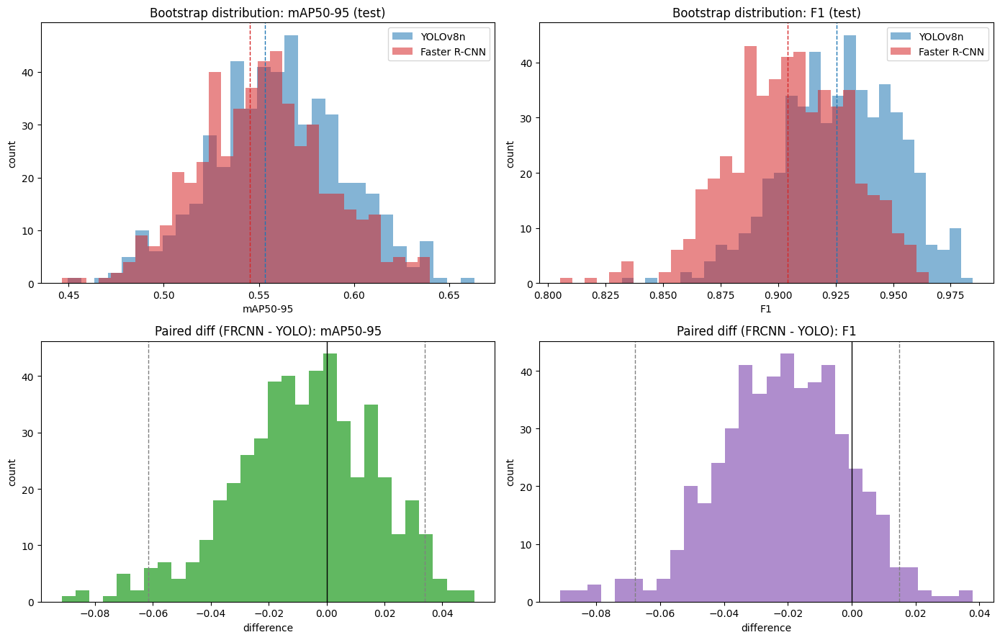

Saved figure to: /content/drive/MyDrive/LicensePlateProject/outputs/bootstrap_comparison/bootstrap_plots.png


In [15]:

fig, axes = plt.subplots(2, 2, figsize=(14, 9))

# mAP50-95 distributions
ax = axes[0, 0]
ax.hist(yolo_map_samples,  bins=30, alpha=0.55, label="YOLOv8n", color="#1f77b4")
ax.hist(frcnn_map_samples, bins=30, alpha=0.55, label="Faster R-CNN", color="#d62728")
ax.axvline(point_yolo_map,  color="#1f77b4", linestyle="--", linewidth=1)
ax.axvline(point_frcnn_map, color="#d62728", linestyle="--", linewidth=1)
ax.set_title("Bootstrap distribution: mAP50-95 (test)")
ax.set_xlabel("mAP50-95"); ax.set_ylabel("count"); ax.legend()

# F1 distributions
ax = axes[0, 1]
ax.hist(yolo_f1_samples,  bins=30, alpha=0.55, label="YOLOv8n", color="#1f77b4")
ax.hist(frcnn_f1_samples, bins=30, alpha=0.55, label="Faster R-CNN", color="#d62728")
ax.axvline(point_yolo_f1,  color="#1f77b4", linestyle="--", linewidth=1)
ax.axvline(point_frcnn_f1, color="#d62728", linestyle="--", linewidth=1)
ax.set_title("Bootstrap distribution: F1 (test)")
ax.set_xlabel("F1"); ax.set_ylabel("count"); ax.legend()

# Paired diff: mAP
ax = axes[1, 0]
ax.hist(map_diff, bins=30, color="#2ca02c", alpha=0.75)
ax.axvline(0, color="black", linewidth=1)
ax.axvline(np.percentile(map_diff, 2.5),  color="gray", linestyle="--", linewidth=1)
ax.axvline(np.percentile(map_diff, 97.5), color="gray", linestyle="--", linewidth=1)
ax.set_title("Paired diff (FRCNN - YOLO): mAP50-95")
ax.set_xlabel("difference"); ax.set_ylabel("count")

# Paired diff: F1
ax = axes[1, 1]
ax.hist(f1_diff, bins=30, color="#9467bd", alpha=0.75)
ax.axvline(0, color="black", linewidth=1)
ax.axvline(np.percentile(f1_diff, 2.5),  color="gray", linestyle="--", linewidth=1)
ax.axvline(np.percentile(f1_diff, 97.5), color="gray", linestyle="--", linewidth=1)
ax.set_title("Paired diff (FRCNN - YOLO): F1")
ax.set_xlabel("difference"); ax.set_ylabel("count")

plt.tight_layout()
plt.savefig(BOOTSTRAP_DIR / "bootstrap_plots.png", dpi=150, bbox_inches="tight")
plt.show()
print("Saved figure to:", BOOTSTRAP_DIR / "bootstrap_plots.png")


## 8. Summary of numbers

In [16]:

map_p = two_sided_p_value(map_diff)
f1_p  = two_sided_p_value(f1_diff)

print(f"Test images: {n_test}   Bootstrap resamples: {N_BOOTSTRAP}")
print(f"YOLO threshold: {yolo_best_threshold}   FRCNN threshold: {frcnn_best_threshold}\n")

print("mAP50-95")
print(f"  YOLOv8n:      {point_yolo_map:.4f}   95% CI [{np.percentile(yolo_map_samples,2.5):.4f}, {np.percentile(yolo_map_samples,97.5):.4f}]")
print(f"  Faster R-CNN: {point_frcnn_map:.4f}   95% CI [{np.percentile(frcnn_map_samples,2.5):.4f}, {np.percentile(frcnn_map_samples,97.5):.4f}]")
print(f"  Paired diff (FRCNN - YOLO): mean {np.mean(map_diff):+.4f}   95% CI [{np.percentile(map_diff,2.5):+.4f}, {np.percentile(map_diff,97.5):+.4f}]   p = {map_p:.4f}\n")

print("F1")
print(f"  YOLOv8n:      {point_yolo_f1:.4f}   95% CI [{np.percentile(yolo_f1_samples,2.5):.4f}, {np.percentile(yolo_f1_samples,97.5):.4f}]")
print(f"  Faster R-CNN: {point_frcnn_f1:.4f}   95% CI [{np.percentile(frcnn_f1_samples,2.5):.4f}, {np.percentile(frcnn_f1_samples,97.5):.4f}]")
print(f"  Paired diff (FRCNN - YOLO): mean {np.mean(f1_diff):+.4f}   95% CI [{np.percentile(f1_diff,2.5):+.4f}, {np.percentile(f1_diff,97.5):+.4f}]   p = {f1_p:.4f}")


Test images: 65   Bootstrap resamples: 500
YOLO threshold: 0.5   FRCNN threshold: 0.7

mAP50-95
  YOLOv8n:      0.5532   95% CI [0.4880, 0.6275]
  Faster R-CNN: 0.5452   95% CI [0.4877, 0.6215]
  Paired diff (FRCNN - YOLO): mean -0.0078   95% CI [-0.0616, +0.0339]   p = 0.7425

F1
  YOLOv8n:      0.9254   95% CI [0.8769, 0.9702]
  Faster R-CNN: 0.9041   95% CI [0.8571, 0.9517]
  Paired diff (FRCNN - YOLO): mean -0.0218   95% CI [-0.0678, +0.0150]   p = 0.2914


# Interpretation and final choice

On mAP50-95 the two models are essentially tied. YOLO sits at 0.5532 and Faster R-CNN at 0.5452, a gap of less than one point, and the paired-difference distribution is centered at −0.0078 with a 95% CI of [−0.0616, +0.0339] that clearly crosses zero. The p-value is 0.7425, so there is no evidence of a real difference between them on this metric.
On F1 YOLO looks stronger on the point estimates (0.9254 vs 0.9041), and the paired-difference distribution does lean in YOLO's favor with a mean gap of −0.0218. But the 95% CI of the difference is [−0.0678, +0.0150] and still crosses zero, with a p-value of 0.2914. So while the visible trend favors YOLO, the gap is not statistically significant on only 65 test images.
Neither metric gives Faster R-CNN a real advantage, and on F1 the trend leans toward YOLO even if the test set is too small to prove it. YOLO is also much lighter, faster at inference, and was faster to train.
Final choice: YOLOv8n. It matches Faster R-CNN on localization quality across IoU levels, trends better at the balanced-F1 operating point, and is the more practical model to deploy.